# Homework 2

## Consegna

 ### 1. Metodo del gradiente

Estendere a funzioni in pi`u variabili:

$f:R^n → R$

la funzione che implementa il metodo di discesa del gradiente (GD) vista
a lezione applicata ad una funzione di una singola variabile, che possa
utilizzare sia il passo fisso che quello variabile calcolato con la funzione
di backtracking. Per i criteri di arresto si propongono (ma si possono
diminuire) i seguenti valori per le tolleranze: tolleranza sul gradiente $10^{-6}$
e sulla differenza fra iterati $10^{-5}$ e un numero massimo di iterazioninon
inferiore a 8000.

Date le funzioni $f:R^n → R$

(a). $f(x_1, x_2) = (x_1 − 5)^2 + (x_2 − 2)^2 $, minimo in $(5,2)$



(b) funzione di Rosenbrock:

$f(x_1, x_2) = (1 − x_1)^2 + 100(x_2 − x_1^2)^2 $, minimo globale in $(1,1)$
passo fisso di $α=0.01,0.005,0.001$ 



(c) funzione multimodale:
$f(x_1, x_2) = x_1^4 -x_1^2+x_2^2 $, minimi in $(-1/√2,0), (1/√2,0)$, massimo in $(0,0)$

punto iniziale:$(0.5,1), (-0.5,-1),(0.1,0.2)$

passo fisso e backtracking.


(d) Minimi quadrati lineari:
$f(x) = 1/2 ||Ax−b||_2 ^2$ dove $A ∈ R^{n×n}$ e una
matrice con elementi casuali (ottenuti con la funzione numpy.random.random)
oppure la matrice di Vandermonde (ottenuta con la funzione numpy.vander)
associata al vettore $v ∈ R^n$ che contiene n valori equispaziati nell’intervallo
$[0,1]$ e  $b ∈ R^n$ e calcolato ponendo $x^* =  (1, 1, . . . , 1)^T $ e $ b = Ax^*$

(e) Minimi quadrati con regolarizzazione:
$f(x) = 1/2 ||Ax−b||_2 ^2 + λ||x||_2^2,  λ ∈[0,1]$ con la stessa matrice e etermine noto precedente.

(f) $f(x) = \sum_{i=1}^{n} (x_i-i)^2  - \sum_{i=1}^{n} ln(x_i) , x_i >0$

Soluzione esatta:
$$x_i^* = \frac{i + \sqrt{i^2 + 2}}{2}, \quad i = 1, \ldots n$$

(g) $f(x) = \sum_{i=1}^{n} (x_i-b_i)^2  +c \sum_{i=1}^{n} ln(x_i) , x_i >0$

Soluzione esatta:
$$x_i^* = \frac{b_i + \sqrt{b_i^2 - 2c}}{2}, \quad i = 1, \ldots n$$

Testare su almeno 4 delle funzioni precedenti cosi scelte:

(a) una funzione scelta fra 1) e 3)

(b) La funzione 2)

(c) una funzione scelta fra 4) e 5)

(d) una funzione scelta fra 6) e 7)




### 2. Metodo del gradiente stocastico
Implementare la versione stocastica del metodo del gradiente e confrontare
i risultati con il metodo del gradiente su una o due delle funzioni d)-g)
i a scelta. In particolare confrontare i grafici dell’errore relativo e della
del valore della funzione obiettivo al variare delle iterazioni, per diversa
dimensione del minibatch.


## Codici degli algoritmi

Backtracking

In [2]:
import numpy as np
import matplotlib.pyplot as plt

In [3]:
def backtracking(f, xk, grad_k, rho=0.5, c=1e-4):
    
    alpha = 0.5
    fk = f(xk)
    pk = -grad_k                        
    
                                                                                          
                                                                 
    while f(xk + alpha * pk) > fk + c * alpha * np.dot(grad_k, pk):
        alpha = alpha * rho
        if alpha < 1e-16:                                             
            break
    
    return alpha

Metodo del Gradiente

In [4]:
def GD(f, df, x0, x_true, alpha, maxit=8000, tolf=1e-6, tolx=1e-5, use_backtracking=False):
                      
    k = 0
    rel_err = np.zeros((maxit+1, ))
    val = np.zeros((maxit+1, ))
    grad_norm = np.zeros((maxit+1, ))
    x_history = [x0.copy()]    
    x = x0.copy()
    
                     
    condizione = True
    while condizione:
                               
        grad = df(x)
        
                              
        rel_err[k] = np.linalg.norm(x - x_true) / np.linalg.norm(x_true)
        val[k] = f(x)
        grad_norm[k] = np.linalg.norm(grad)
        
                           
        if use_backtracking:
            alpha_k = backtracking(f, x, grad)
        else:
            alpha_k = alpha
        
                                                         
        x_new = x - alpha_k * grad
        
                                     
        condizione = (k < maxit) and (np.linalg.norm(grad) > tolf) and (np.linalg.norm(x_new - x) > tolx)
        
                                          
        k = k + 1
        x = x_new
        x_history.append(x.copy())

                                   
    if k < maxit + 1:
        rel_err[k] = np.linalg.norm(x - x_true) / np.linalg.norm(x_true)
        val[k] = f(x)
        grad_norm[k] = np.linalg.norm(df(x))
        k = k + 1
    
                                    
    rel_err = rel_err[:k]
    val = val[:k]
    grad_norm = grad_norm[:k]

    return x, rel_err, val, grad_norm, k, np.array(x_history)

Metodo del gradiente stocastico

In [5]:
def SGD(f, df_i, x0, x_true, n, alpha, maxit=20000, tolf=1e-6, tolx=1e-5, batch_size=1, lr_schedule='fixed'):
                      
    k = 0
    rel_err = np.zeros((maxit+1, ))
    val = np.zeros((maxit+1, ))
    grad_norm = np.zeros((maxit+1, ))
    
    x = x0.copy()
    x_history = [x.copy()]
    
                     
    condizione = True
    while condizione:
                              
        rel_err[k] = np.linalg.norm(x - x_true) / np.linalg.norm(x_true)
        val[k] = f(x)
        
                                         
        indices = np.random.choice(n, size=batch_size, replace=False)
        
                                                                              
        grad_stoch = np.zeros_like(x)
        for i in indices:
            grad_stoch += df_i(x, i)
        grad_stoch = grad_stoch / batch_size
        
        grad_norm[k] = np.linalg.norm(grad_stoch)
        
                                
        if lr_schedule == 'decay':
            alpha_k = alpha / np.sqrt(k + 1)
        else:
            alpha_k = alpha
        
                       
        x_new = x - alpha_k * grad_stoch
        
                                     
        condizione = (k < maxit) and (np.linalg.norm(grad_stoch) > tolf) and (np.linalg.norm(x_new - x) > tolx)
        
                                          
        k = k + 1
        x = x_new
        x_history.append(x.copy())                          

    
                                   
    if k < maxit + 1:
        rel_err[k] = np.linalg.norm(x - x_true) / np.linalg.norm(x_true)
        val[k] = f(x)
        k = k + 1
    
                                    
    rel_err = rel_err[:k]
    val = val[:k]
    grad_norm = grad_norm[:k]
    
    
    return x, rel_err, val, grad_norm, k, np.array(x_history)

## Conclusioni

Il notebook implementa:

1. **Metodo del gradiente (GD)** per funzioni multivariabili con:
   - Passo fisso
   - Passo variabile con backtracking

2. **Metodo del gradiente stocastico (SGD)** con minibatch configurabile

3. **Test su 4 funzioni diverse**:
   - (a) Funzione quadratica semplice
   - (b) Funzione di Rosenbrock (difficile, mal condizionata)
   - (d) Minimi quadrati lineari
   - (f) Funzione con logaritmi

4. **Confronto GD vs SGD** su funzioni (d) ed (e) con diverse dimensioni di batch

I risultati mostrano che:
- Il backtracking generalmente converge più velocemente del passo fisso
- La funzione di Rosenbrock richiede molte iterazioni e passi molto piccoli
- SGD con batch piccoli è più rumoroso ma può essere più veloce per funzioni con molte componenti
- All'aumentare della dimensione del batch, SGD si avvicina al comportamento di GD

Metodo per stampare le curve di livello

In [6]:
                                                         

def plot_3d_universal(f, xtrue, xn=None, x1_limits=(-10, 10), x2_limits=(-10, 10), title_prefix="Grafico"):
    
    
                                    
    if xn is not None:
                                                    
        if xn.shape[0] > 2:
            print(f"[{title_prefix}] Skipping plot: Dimensione input N={xn.shape[0]} > 2 (impossibile visualizzare in 3D)")
            return
        else:
            print(f"[{title_prefix}] Plotting consentito: Dimensione input N={xn.shape[0]}")

                          
    x1_range = np.linspace(x1_limits[0], x1_limits[1], 100) 
    x2_range = np.linspace(x2_limits[0], x2_limits[1], 100) 
    X1, X2 = np.meshgrid(x1_range, x2_range)

                                                
    try:
                                                                                
        X_stack = np.stack([X1, X2], axis=0)
        Z = f(X_stack)
        call_type = "Vettoriale (unico argomento)"
    except TypeError:
                                                                    
        Z = f(X1, X2)
        call_type = "Separato (argomenti x1, x2)"
    except Exception as e:
        print(f"Errore durante il calcolo della funzione: {e}")
        return

    print(f"Plotting '{title_prefix}' usando modalità: {call_type}")

                         
    fig = plt.figure(figsize=(14, 6))

                     
    ax1 = fig.add_subplot(1, 2, 1, projection='3d')
    surf = ax1.plot_surface(X1, X2, Z, cmap='viridis', edgecolor='none', alpha=0.8)
    
    ax1.set_title(f'{title_prefix} - 3D')
    ax1.set_xlabel('$x_1$')
    ax1.set_ylabel('$x_2$')
    ax1.set_zlabel('f(x)')
    fig.colorbar(surf, ax=ax1, shrink=0.5, aspect=10)

                          
    ax2 = fig.add_subplot(1, 2, 2)
    contour = ax2.contour(X1, X2, Z, levels=30, cmap='viridis')
    ax2.clabel(contour, inline=True, fontsize=8)
    
    if np.array(xtrue).size > 2:
        ax2.plot(xtrue[1][0], xtrue[1][1], 'r*', markersize=15, label='Minimo Esatto (N=2)')
        ax2.plot(xtrue[0][0], xtrue[0][1], 'r*', markersize=15, label='Minimo Esatto (N=2)')

        
    else : ax2.plot(xtrue[0], xtrue[1], 'r*', markersize=15, label='Minimo Esatto (N=2)')
    ax2.legend()

    ax2.set_title(f'{title_prefix} - Curve di Livello')
    ax2.set_xlabel('$x_1$')
    ax2.set_ylabel('$x_2$')
    ax2.grid(True, linestyle='--', alpha=0.6)

    plt.tight_layout()
    plt.show()

Funzione per stampare l'andamento di Xk

In [7]:
def plot_path_final(f, x_history, x_true, title="Percorso Ottimizzazione"):
    if x_true.shape[0] > 2:
        print(f"[{title}] Skipping path plot: Dimensione input N={x_true.shape[0]} > 2 (impossibile visualizzare percorso in 2D)")
        return
    path = np.array(x_history)
                                          
    min_x = min(path[:, 0].min(), x_true[0].min())
    max_x = max(path[:, 0].max(), x_true[0].max())
    min_y = min(path[:, 1].min(), x_true[1].min())
    max_y = max(path[:, 1].max(), x_true[1].max())

    pad_x = max((max_x - min_x) * 0.2, 1.0)                         
    pad_y = max((max_y - min_y) * 0.2, 1.0)

    x_grid = np.linspace(min_x - pad_x, max_x + pad_x, 150)
    y_grid = np.linspace(min_y - pad_y, max_y + pad_y, 150)
    X, Y = np.meshgrid(x_grid, y_grid)

                                                                                    
    Z = np.zeros_like(X)
    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            Z[i, j] = f(np.array([X[i, j], Y[i, j]]))

                             
    fig, ax = plt.subplots(figsize=(8, 4))

                                                                                              
    cp = ax.contour(X, Y, Z, levels=40, cmap='viridis', zorder=1)

              
    ax.plot(path[:, 0], path[:, 1], color='orange', linewidth=1.5, alpha=0.7, label='Percorso', zorder=2)

           
    ax.scatter(path[0, 0], path[0, 1], c='lime', s=100, label='Start', edgecolors='black', zorder=3)
    if np.array(x_true).size > 2:
        ax.plot(x_true[1][0], x_true[1][1], 'r*', markersize=15, label='Minimo Esatto (N=2)')
        ax.plot(x_true[0][0], x_true[0][1], 'r*', markersize=15, label='Minimo Esatto (N=2)')

        
    else : ax.plot(x_true[0], x_true[1], 'r*', markersize=15, label='Minimo Esatto (N=2)')
                                                      
    ax.scatter(path[-1, 0], path[-1, 1], c='cyan', s=120, label='End', edgecolors='blue', zorder=10)

    ax.set_title(title)
    ax.legend()
    ax.grid(True, alpha=0.3)
    plt.show()


Funzione A

In [8]:
def f_a(x):
    return (x[0] - 5)**2 + (x[1] - 2)**2

def grad_f_a(x):
    dfdx1 = 2 * (x[0] - 5)
    dfdx2 = 2 * (x[1] - 2)
    return np.array([dfdx1, dfdx2])

def df_i_a(x, i):
    if i == 0:
        return np.array([2 * (x[0] - 5), 0.0])
    elif i == 1:
        return np.array([0.0, 2 * (x[1] - 2)])
    else:
        raise IndexError("Indice i fuori dai limiti per df_i_a")

def get_exact_solution_a():
    return np.array([5.0, 2.0])

Funzione B

In [9]:
def f_b(x):
    return (1 - x[0])**2 + 100*(x[1] - x[0]**2)**2

def grad_f_b(x):
    dfdx1 = -2 * (1 - x[0]) - 400 * x[0] * (x[1] - x[0]**2)
    dfdx2 = 200 * (x[1] - x[0]**2)
    return np.array([dfdx1, dfdx2])

def df_i_b(x, i):
    if i == 0:
        return np.array([-2 * (1 - x[0]) - 400 * x[0] * (x[1] - x[0]**2), 0.0])
    elif i == 1:
        return np.array([0.0, 200 * (x[1] - x[0]**2)])
    else:
        raise IndexError("Indice i fuori dai limiti per df_i_b")

def get_exact_solution_b():
    return np.array([1.0, 1.0])

Funzione C

In [10]:
def f_c(x):
    return x[0]**4 - x[0]**2 + x[1]**2

def grad_f_c(x):
    dfdx1 = 4 * x[0]**3 - 2 * x[0]
    dfdx2 = 2 * x[1]
    return np.array([dfdx1, dfdx2])

def df_i_c(x, i):
    if i == 0:
        return np.array([4 * x[0]**3 - 2 * x[0], 0.0])
    elif i == 1:
        return np.array([0.0, 2 * x[1]])
    else:
        raise IndexError("Indice i fuori dai limiti per df_i_c")

def get_exact_solutions_c():
    return np.array([np.array([-1/np.sqrt(2), 0.0]), np.array([1/np.sqrt(2), 0.0])])

Funzione D

In [11]:
def setup_problem_d(n):                                               
    A = np.random.random((n, n))                                 
    x_true = np.ones(n)                                                   
    b = A @ x_true                                                    
    lam = np.random.uniform(0,1)                                                   

    print(f"Matrice A:\n{A}")
    print(f"Vettore b: {b}")
    print(f"Parametro di regolarizzazione lambda: {lam}")

    def f_d(x):
                                                                                               
                                             
                                             
        
        r0 = A[0, 0] * x[0] + A[0, 1] * x[1] - b[0]
        r1 = A[1, 0] * x[0] + A[1, 1] * x[1] - b[1]
        
                                                                                   
        norm_sq = r0**2 + r1**2
        
        return 0.5 * norm_sq

    def grad_f_d(x):
                                                
        Ax_minus_b = A @ x - b
        grad = A.T @ Ax_minus_b
        return grad

    def df_i_d(x, i):
                                                                                 
        Ai = A[i, :]                     
        ri = Ai @ x - b[i]                   
        grad_i = ri * Ai                      
        return grad_i

    def get_exact_solution_d():
        return np.array(np.linalg.solve(A, b))
    
    return f_d, grad_f_d, df_i_d, get_exact_solution_d, A, b, lam

Funzione E

In [12]:
def setup_problem_e(n):                                               
    A = np.random.random((n, n))                                 
    x_true = np.ones(n)                                                   
    b = A @ x_true                                                    
    lam = np.random.uniform(0,1)                                                   

    print(f"Matrice A:\n{A}")
    print(f"Vettore b: {b}")
    print(f"Parametro di regolarizzazione lambda: {lam}")

    def f_e(x):
                                        
        r0 = A[0, 0] * x[0] + A[0, 1] * x[1] - b[0]
        r1 = A[1, 0] * x[0] + A[1, 1] * x[1] - b[1]
        norm_sq_resid = r0**2 + r1**2
        
                                                          
        norm_sq_x = x[0]**2 + x[1]**2
        
                      
        return 0.5 * norm_sq_resid + lam * norm_sq_x

    def grad_f_e(x):
                                                             
        Ax_minus_b = A @ x - b
        grad_resid = A.T @ Ax_minus_b
        grad_reg = 2 * lam * x
        grad = grad_resid + grad_reg
        return grad

    def df_i_e(x, i):
                                                                                                      
        Ai = A[i, :]                     
        ri = Ai @ x - b[i]                   
        grad_i_resid = ri * Ai                              
        grad_i_reg = 2 * lam * x                                                           
        grad_i = grad_i_resid + grad_i_reg
        return grad_i

    def get_exact_solution_e():
        n = A.shape[0]
        return np.linalg.solve(A.T @ A + 2*lam*np.eye(n), A.T @ b)
    
    return f_e, grad_f_e, df_i_e, get_exact_solution_e, A, b, lam


Funzione F

In [13]:
def f_f(x):
                                                                                       
    if isinstance(x, (list, tuple)):
        x = np.stack(x, axis=0)
        
    n = x.shape[0]
    
                                                               
    i = np.arange(1, n + 1)
    if x.ndim > 1:
        shape_diff = x.ndim - 1
        i = i.reshape((n,) + (1,) * shape_diff)
        
    term_sq = np.sum((x - i)**2, axis=0)
    term_ln = np.sum(np.log(x), axis=0)
    
    return term_sq - term_ln

def grad_f_f(x):
                                                                                       
    if isinstance(x, (list, tuple)):
        x = np.stack(x, axis=0)
        
    n = x.shape[0]
    
                                                               
    i = np.arange(1, n + 1)
    if x.ndim > 1:
        shape_diff = x.ndim - 1
        i = i.reshape((n,) + (1,) * shape_diff)
        
    grad = 2 * (x - i) - 1 / x
    return grad

def df_i_f(x, i=0):
                                                                                 
    n = x.shape[0]
    
                                                               
    i_vec = np.arange(1, n + 1)
    if x.ndim > 1:
        shape_diff = x.ndim - 1
        i_vec = i_vec.reshape((n,) + (1,) * shape_diff)
    
    grad_i = 2 * (x - i_vec) - 1 / x
    return grad_i

def get_exact_solution_f(n):
    i = np.arange(1, n + 1)
    return (i + np.sqrt(i**2 + 2)) / 2

Funzione G

In [14]:
def setup_problem_g(n):                                               
    C_CONST = -1.0     
    B_VECTOR = np.random.uniform(0, 2002, n)
    print(f"Configurazione:\n N={n}\n c={C_CONST}\n b={B_VECTOR}")

    def f_g(x):
                                            
        if isinstance(x, (list, tuple)):
            x = np.stack(x, axis=0)
        
                                                              
        b = B_VECTOR
        if x.ndim > 1:
            shape_diff = x.ndim - 1
            b = b.reshape((n,) + (1,) * shape_diff)
            
                                               
                                                             
                                                                                 
                                                                             
                                                                                
                                   
        
                                                                              
                                                                                   
                                                                             
        
        term_sq = np.sum((x - b)**2, axis=0)
        
                                                                                    
        with np.errstate(divide='ignore', invalid='ignore'):
            term_ln = np.sum(np.log(x), axis=0)
        
                                                                                            
        return term_sq + C_CONST * term_ln

    def grad_f_g(x):
        return 2 * (x - B_VECTOR) + C_CONST / x

    def df_i_g(x, i = 0):
        return 2 * (x - B_VECTOR) + C_CONST / x[i]

    def get_exact_solution_g():
        discriminant = B_VECTOR**2 - 2 * C_CONST
        if np.any(discriminant < 0):
            print("ATTENZIONE: Nessuna soluzione reale")
            return np.zeros_like(B_VECTOR)
        return (B_VECTOR + np.sqrt(discriminant)) / 2
    
    return f_g, grad_f_g, df_i_g, get_exact_solution_g, B_VECTOR

Funzione stampa grafico errore, gradiente e valore della funzione

In [15]:
def stamp(rel_err, val, grad_norm, k):
    
    iterations = np.arange(k)
    
    fig, axs = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle('Analisi della Convergenza del Metodo del Gradiente', fontsize=16)

                                     
    axs[0].plot(iterations, rel_err, color='blue', linewidth=2)
    axs[0].set_title('Errore Relativo')
    axs[0].set_xlabel('Iterazioni')
    axs[0].set_ylabel('$||x_k - x_{true}|| / ||x_{true}||$')
    axs[0].grid(True, which="both", ls="-", alpha=0.5)

                                                    
    axs[1].plot(iterations, val, color='green', linewidth=2)
    axs[1].set_title('Valore della Funzione $f(x)$')
    axs[1].set_xlabel('Iterazioni')
    axs[1].set_ylabel('$f(x_k)$')
    axs[1].grid(True, alpha=0.5)

                                          
    axs[2].plot(iterations, grad_norm, color='red', linewidth=2)
    axs[2].set_title('Norma del Gradiente')
    axs[2].set_xlabel('Iterazioni')
    axs[2].set_ylabel('$||\nabla f(x_k)||$')
    axs[2].grid(True, which="both", ls="-", alpha=0.5)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

Funzione Test

In [16]:
def show_GD(f, df, x0, x_true, alpha, use_backtracking=False):
    x_gd, rel_err_gd, val_gd, grad_norm_gd, k, history = GD(f, df, x0, x_true, alpha, use_backtracking=use_backtracking)
    print(f"GD: Soluzione trovata: {x_gd}, Errore assoluto finale: {rel_err_gd[-1]:.3e}")
    print(f"senza backtracking, passo fisso alpha={alpha}, iterazioni totali={k}")
    stamp(rel_err_gd, val_gd, grad_norm_gd, k)
    plot_path_final(f, history, x_true)

def show_SGD(f, df_i, x0, x_true, n = 2, alpha = 0.1, batch_size=1, lr_schedule='fixed'):
    x_sgd, rel_err_sgd, val_sgd, grad_norm_sgd, k_sgd, history_sgd = SGD(f, df_i, x0, x_true, n=n, alpha = alpha, batch_size=batch_size)
    print(f"SGD: Soluzione trovata: {x_sgd}, Errore assoluto finale: {rel_err_sgd[-1]:.3e}")
    print(f"con passo fisso alpha= {alpha} e batch size=10, quindi {k_sgd/(n/batch_size)} epoche")
    stamp(rel_err_sgd, val_sgd, grad_norm_sgd, k_sgd)
    plot_path_final(f, history_sgd, x_true)

In [17]:
def test(f, df, df_i, x0, x_true, alpha = 0.1, n= 2, batch_size=1):
    print(f"Punto iniziale {x0}")
    x_gd, rel_err_gd, val_gd, grad_norm_gd, k, history = GD(f, df, x0, x_true, alpha, use_backtracking= False)
    print(f"GD: Soluzione trovata: {x_gd}, Errore assoluto finale: {rel_err_gd[-1]:.3e}")
    print(f"senza backtracking, passo fisso alpha={alpha}")
    stamp(rel_err_gd, val_gd, grad_norm_gd, k)
    plot_path_final(f, history, x_true)

    x_gdb, rel_err_gdb, val_gdb, grad_norm_gdb, k_b, history_b= GD(f, df, x0, x_true, alpha, use_backtracking= True)
    print(f"GD: Soluzione trovata: {x_gdb}, Errore assoluto finale: {rel_err_gdb[-1]:.3e}")
    print(f"con backtracking")
    stamp(rel_err_gdb, val_gdb, grad_norm_gdb, k_b)
    plot_path_final(f, history_b, x_true)

    
    x_sgd, rel_err_sgd, val_sgd, grad_norm_sgd, k_sgd, history_sgd = SGD(f, df_i, x0, x_true, n=n, alpha = 0.001, batch_size=batch_size)
    print(f"SGD: Soluzione trovata: {x_sgd}, Errore assoluto finale: {rel_err_sgd[-1]:.3e}")
    print(f"con passo fisso alpha=0.001 e batch size={batch_size}, quindi {k_sgd/(n/batch_size)} epoche")
    stamp(rel_err_sgd, val_sgd, grad_norm_sgd, k_sgd)
    plot_path_final(f, history_sgd, x_true)


    risultati = np.array([
        [val_gd[-1], k,  rel_err_gd[-1], grad_norm_gd[-1]],
        [val_gdb[-1], k_b,  rel_err_gdb[-1], grad_norm_gdb[-1]],
        [val_sgd[-1], k_sgd,  rel_err_sgd[-1], grad_norm_sgd[-1]]
    ])

    intestazioni = ["Valore del minimo", "Iterazioni", "Errore assoluto", "Gradiente finale", "Punto iniziale"]
                                                                  
    cell_text = []
    for row in risultati:
                                                        
                                            
                                                                                                
                                                                
                                                                   
        formatted_row = [
            f"{row[0]:.4f}", 
            f"{row[1]:.0f}", 
            f"{row[2]:.1e}", 
            f"{row[3]:.1e}"
        ]
        cell_text.append(formatted_row)
    fig, ax = plt.subplots()

    ax.axis('tight')
    ax.axis('off')

    tabella = ax.table(
        cellText=cell_text,
        colLabels=intestazioni,
        loc='center',
        cellLoc='center'
    )

    tabella.auto_set_font_size(False)
    tabella.set_fontsize(12)
    tabella.scale(1.2, 1.2)

    plt.show()

[Funzione A] Plotting consentito: Dimensione input N=2
Plotting 'Funzione A' usando modalità: Vettoriale (unico argomento)


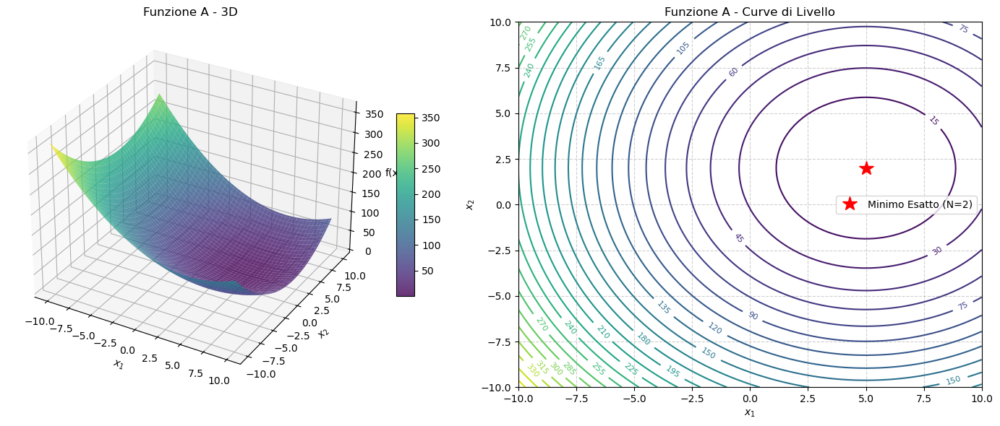

Punto iniziale [0. 0.]
GD: Soluzione trovata: [4.99996346 1.99998538], Errore assoluto finale: 7.308e-06
senza backtracking, passo fisso alpha=0.1


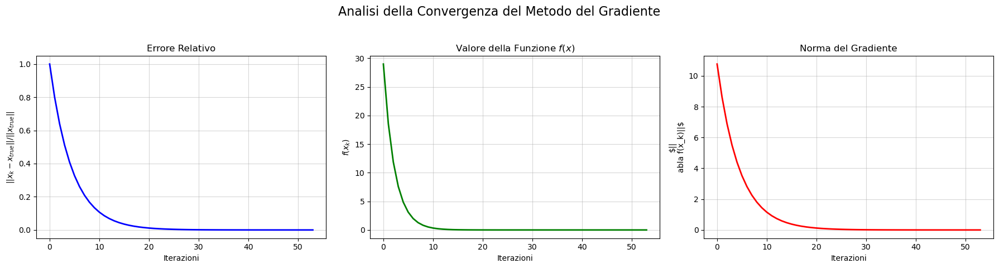

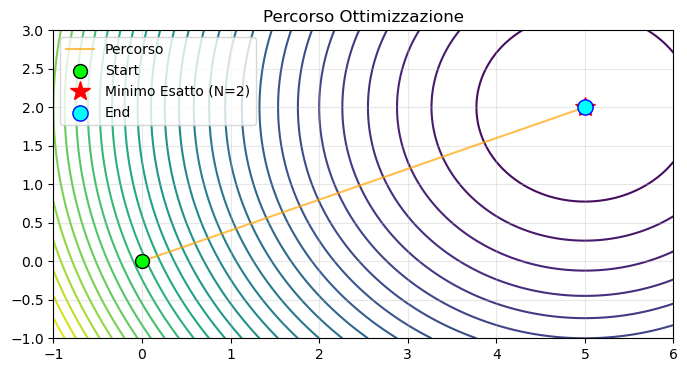

GD: Soluzione trovata: [5. 2.], Errore assoluto finale: 0.000e+00
con backtracking


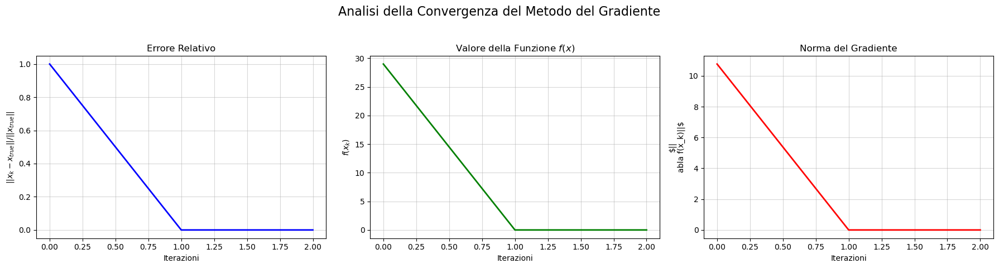

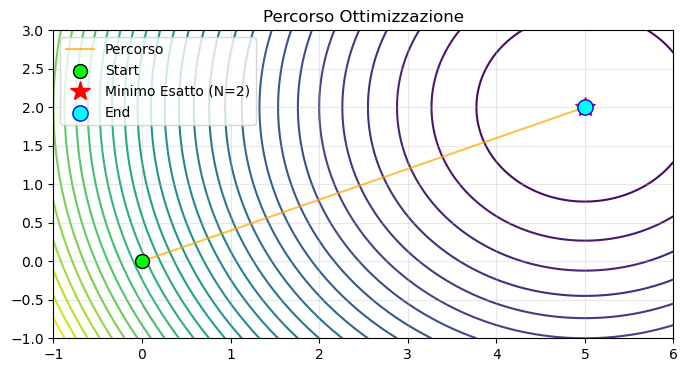

SGD: Soluzione trovata: [4.98979378 1.99501264], Errore assoluto finale: 2.109e-03
con passo fisso alpha=0.001 e batch size=1, quindi 3044.5 epoche


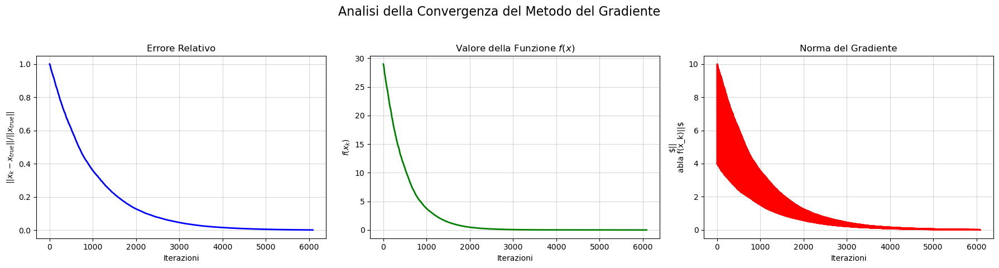

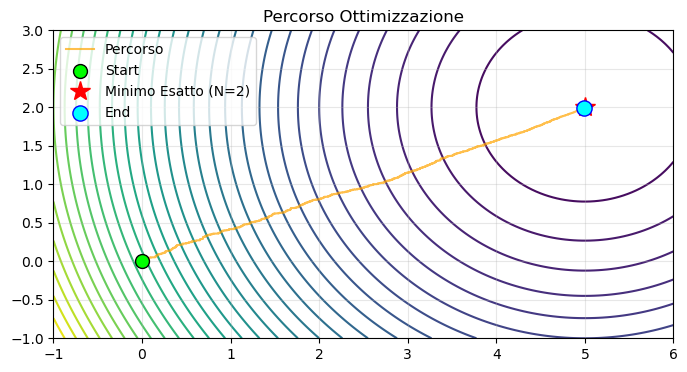

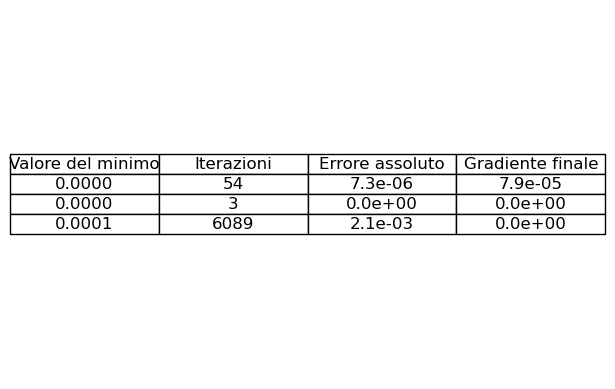

GD: Soluzione trovata: [4.99954899 1.99981959], Errore assoluto finale: 9.020e-05
senza backtracking, passo fisso alpha=0.01, iterazioni totali=462


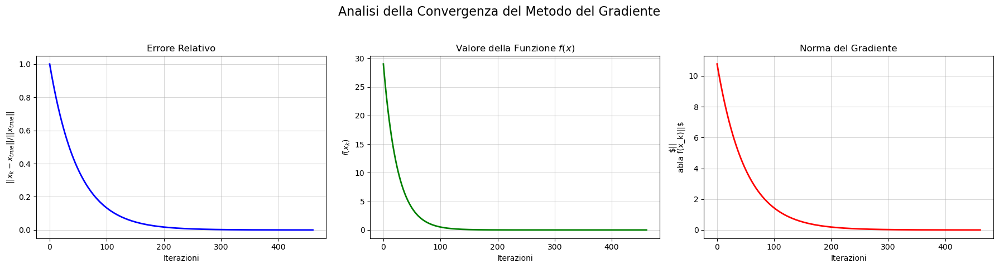

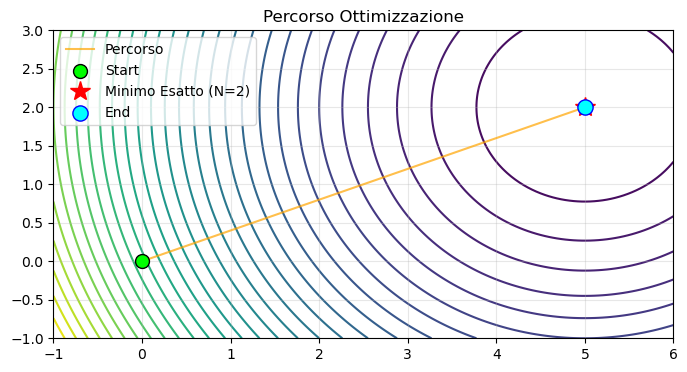

GD: Soluzione trovata: [10.  4.], Errore assoluto finale: 1.000e+00
senza backtracking, passo fisso alpha=1, iterazioni totali=8001


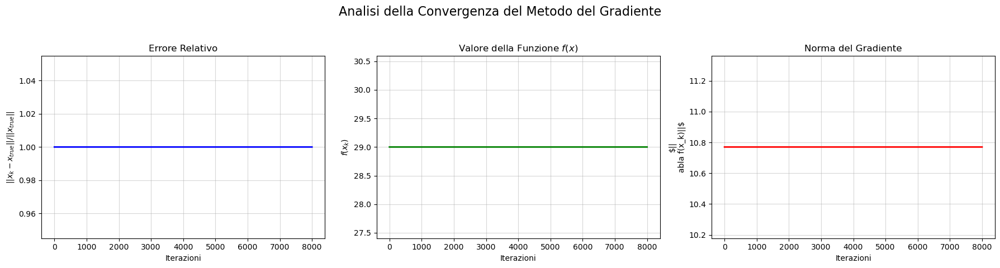

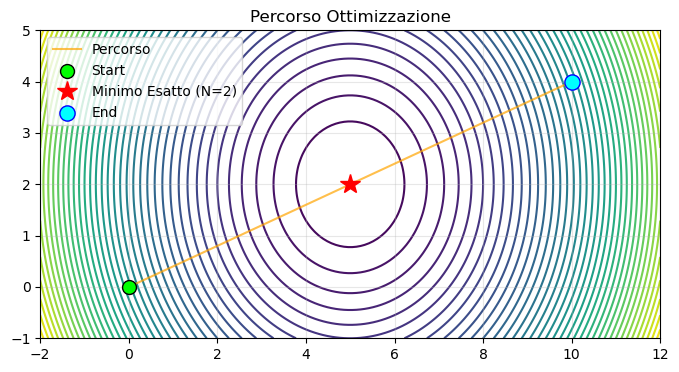

[Funzione di Rosenbrock] Plotting consentito: Dimensione input N=2
Plotting 'Funzione di Rosenbrock' usando modalità: Vettoriale (unico argomento)


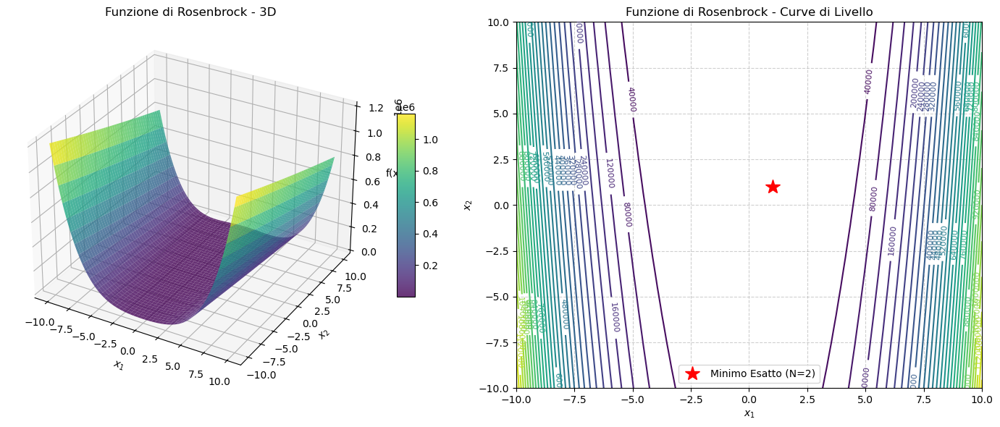

Punto iniziale [0. 0.]
GD: Soluzione trovata: [nan nan], Errore assoluto finale: nan
senza backtracking, passo fisso alpha=0.01


c:\Users\alext\anaconda3\envs\CN26\Lib\site-packages\numpy\linalg\_linalg.py:2767: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
C:\Users\alext\AppData\Local\Temp\ipykernel_13300\2300242359.py:5: RuntimeWarning: overflow encountered in scalar power
  dfdx1 = -2 * (1 - x[0]) - 400 * x[0] * (x[1] - x[0]**2)
C:\Users\alext\AppData\Local\Temp\ipykernel_13300\2300242359.py:6: RuntimeWarning: overflow encountered in scalar power
  dfdx2 = 200 * (x[1] - x[0]**2)
C:\Users\alext\AppData\Local\Temp\ipykernel_13300\2300242359.py:2: RuntimeWarning: overflow encountered in scalar power
  return (1 - x[0])**2 + 100*(x[1] - x[0]**2)**2
C:\Users\alext\AppData\Local\Temp\ipykernel_13300\2300242359.py:5: RuntimeWarning: invalid value encountered in scalar subtract
  dfdx1 = -2 * (1 - x[0]) - 400 * x[0] * (x[1] - x[0]**2)
C:\Users\alext\AppData\Local\Temp\ipykernel_13300\2300242359.py:6: RuntimeWarning: invalid value encountered in scalar subtract
  dfdx2 = 200 * (x[1] - x[0]**2)
C:\Use

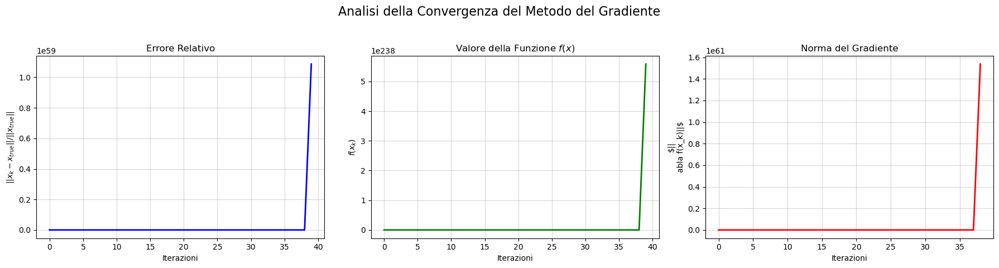

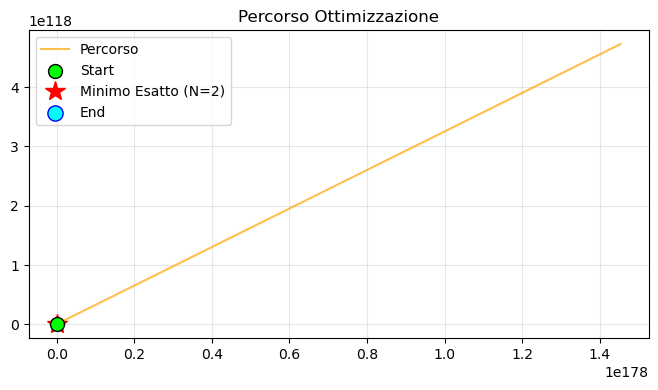

GD: Soluzione trovata: [0.99609721 0.99220165], Errore assoluto finale: 6.166e-03
con backtracking


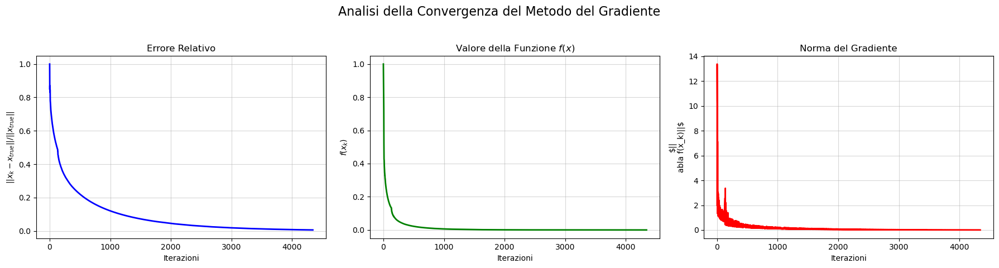

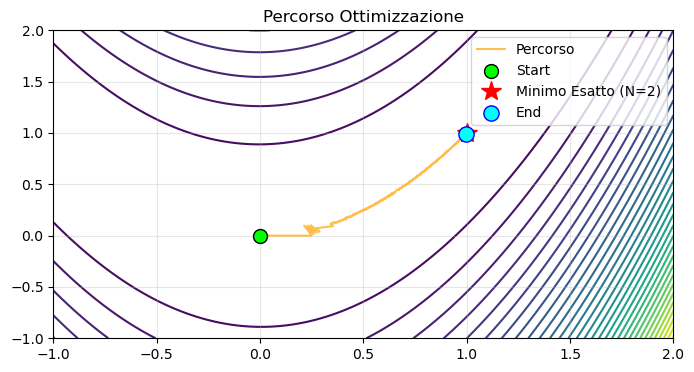

SGD: Soluzione trovata: [2.e-03 8.e-07], Errore assoluto finale: 9.990e-01
con passo fisso alpha=0.001 e batch size=1, quindi 1.5 epoche


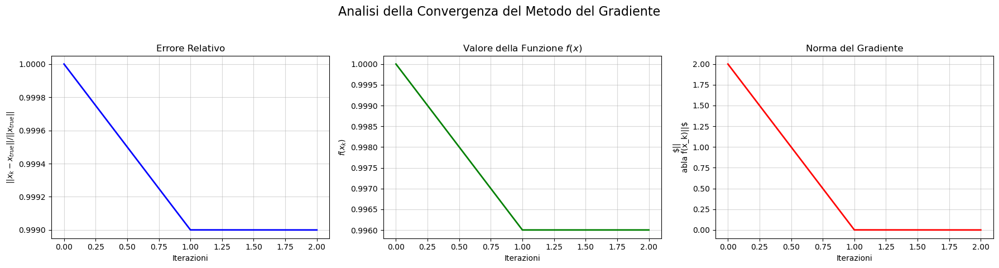

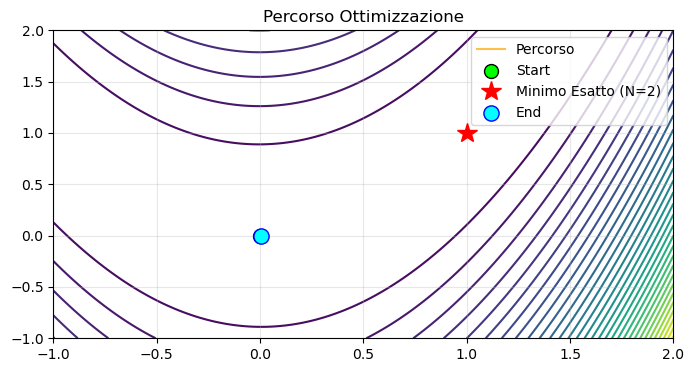

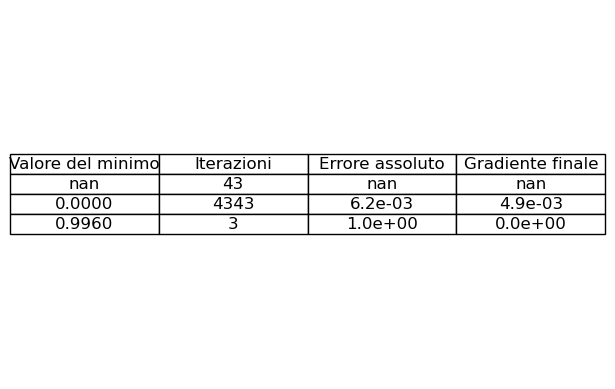

GD: Soluzione trovata: [0.46330448 0.2853615 ], Errore assoluto finale: 6.457e-01
senza backtracking, passo fisso alpha=0.005, iterazioni totali=8001


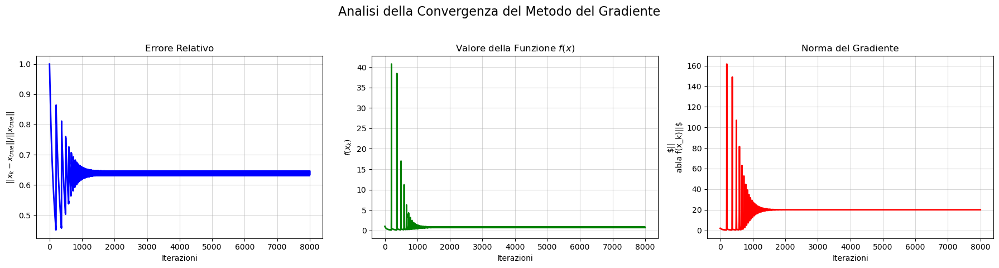

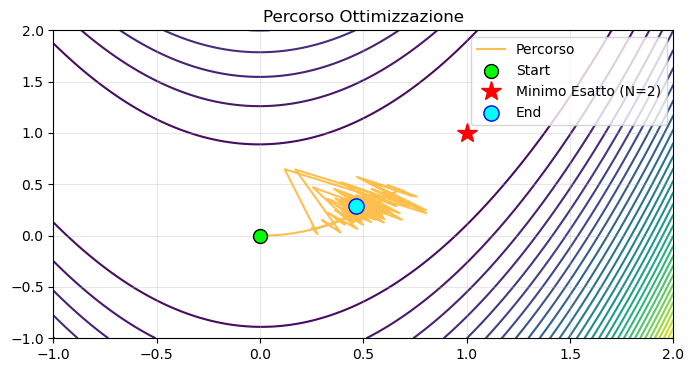

GD: Soluzione trovata: [0.98741906 0.97494568], Errore assoluto finale: 1.983e-02
senza backtracking, passo fisso alpha=0.001, iterazioni totali=8001


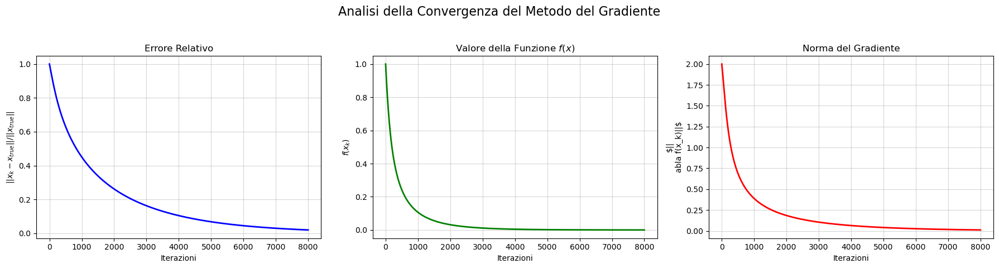

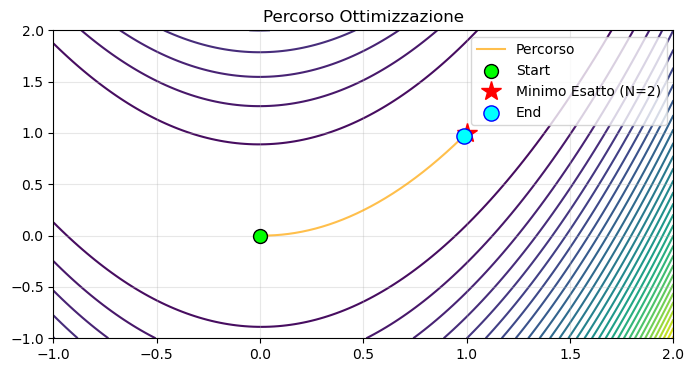

GD: Soluzione trovata: [0.98591073 0.97196312], Errore assoluto finale: 2.220e-02
senza backtracking, passo fisso alpha=0.001, iterazioni totali=8001


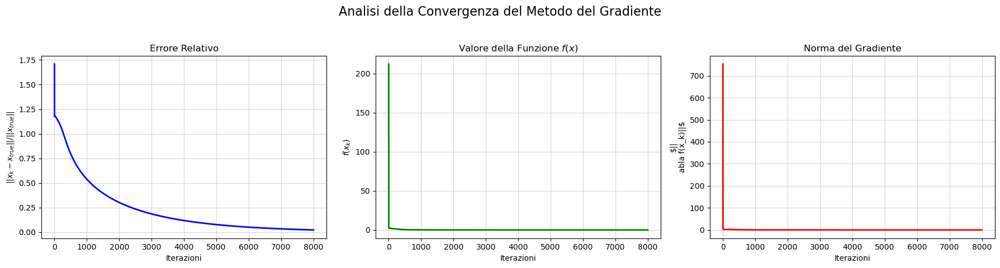

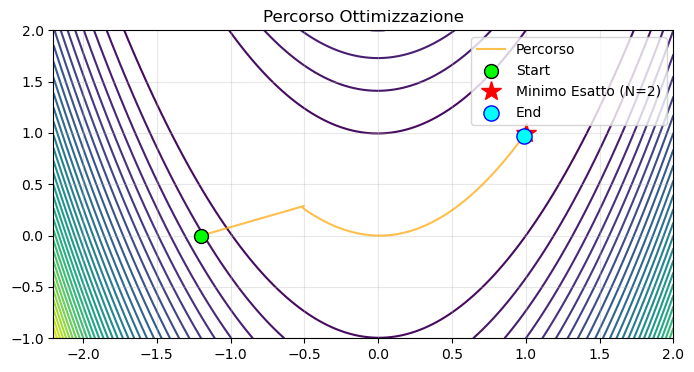

[Funzione multimodale] Plotting consentito: Dimensione input N=2
Plotting 'Funzione multimodale' usando modalità: Vettoriale (unico argomento)


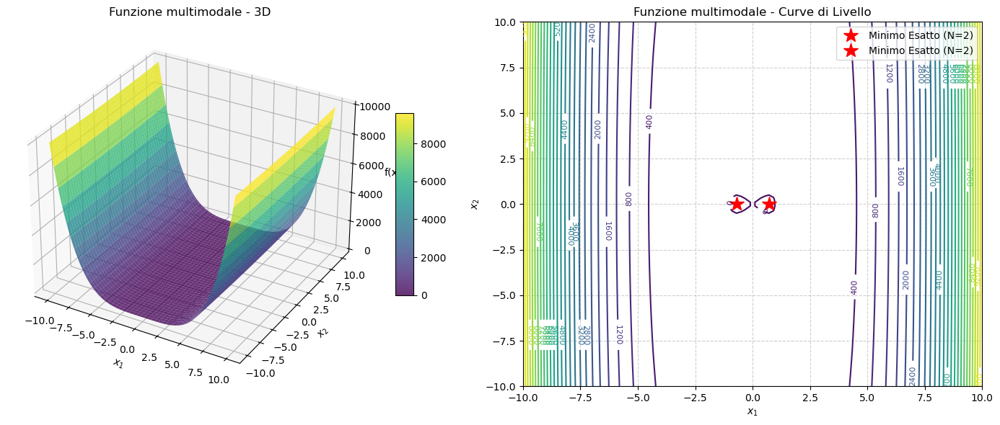

Punto iniziale [0.5 1. ]
GD: Soluzione trovata: [7.07106781e-01 3.48449144e-05], Errore assoluto finale: 1.414e+00
senza backtracking, passo fisso alpha=0.1


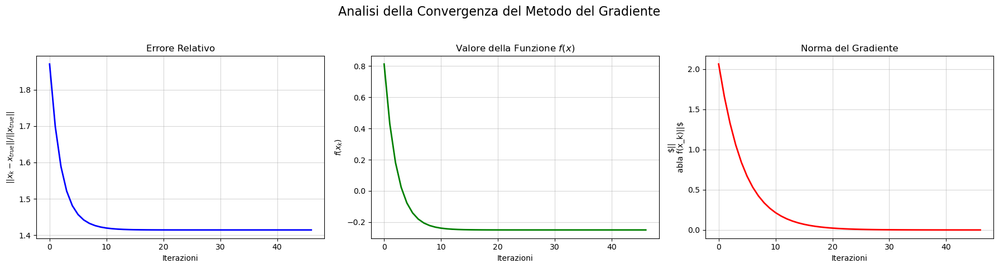

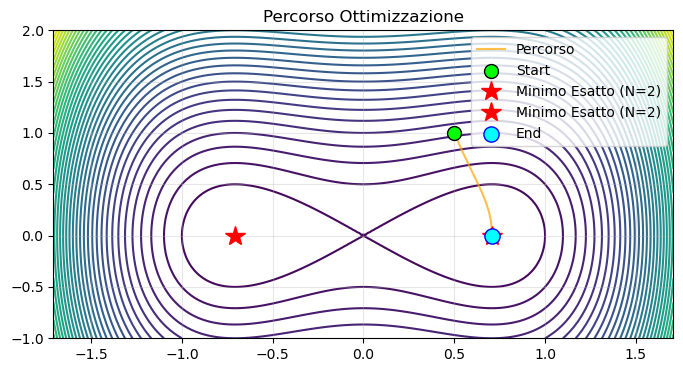

GD: Soluzione trovata: [0.70710678 0.        ], Errore assoluto finale: 1.414e+00
con backtracking


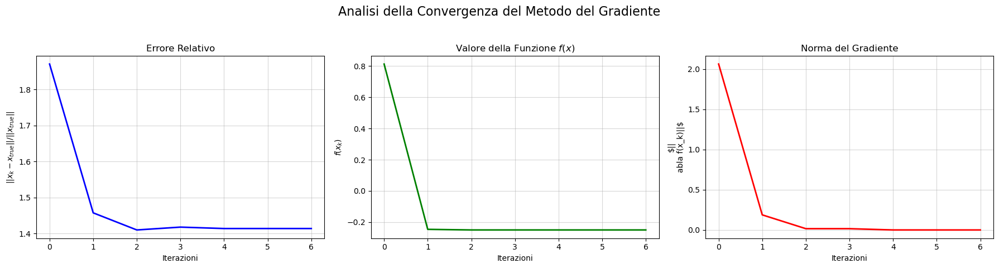

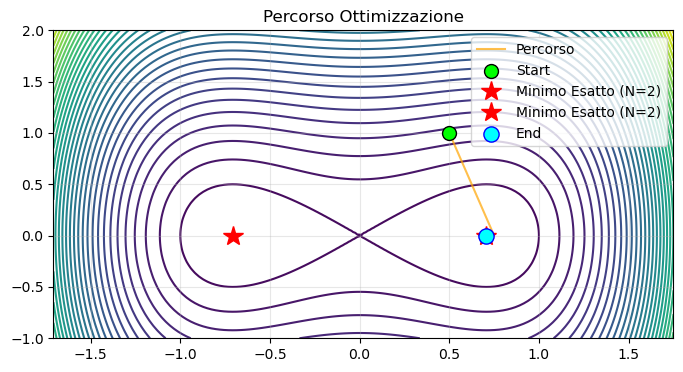

SGD: Soluzione trovata: [0.70461029 0.0887064 ], Errore assoluto finale: 1.417e+00
con passo fisso alpha=0.001 e batch size=1, quindi 1223.0 epoche


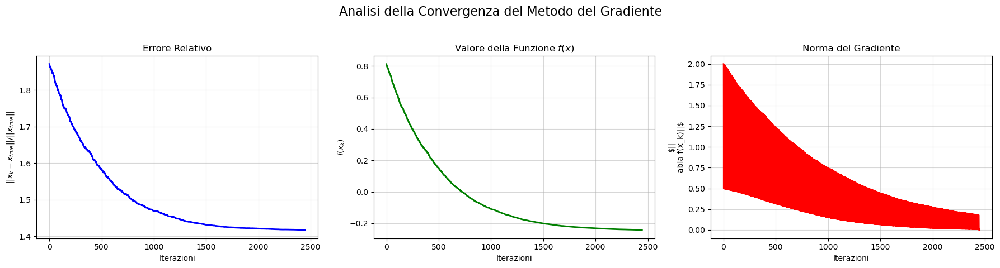

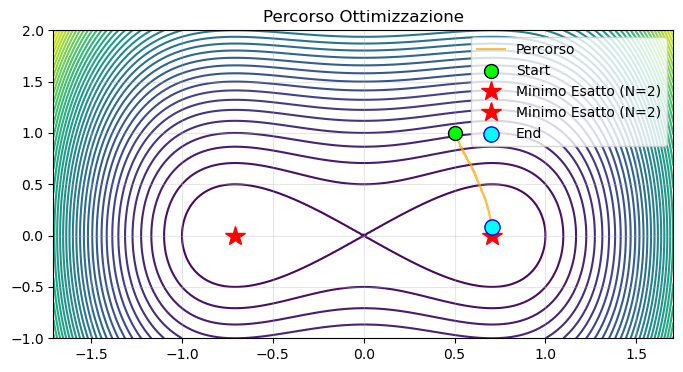

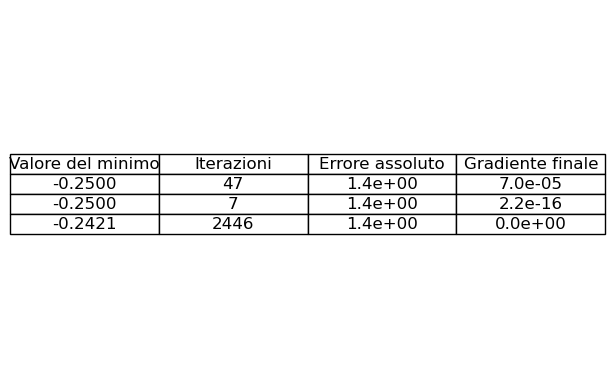

Punto iniziale [-0.5 -1. ]
GD: Soluzione trovata: [-7.07106781e-01 -3.48449144e-05], Errore assoluto finale: 1.414e+00
senza backtracking, passo fisso alpha=0.1


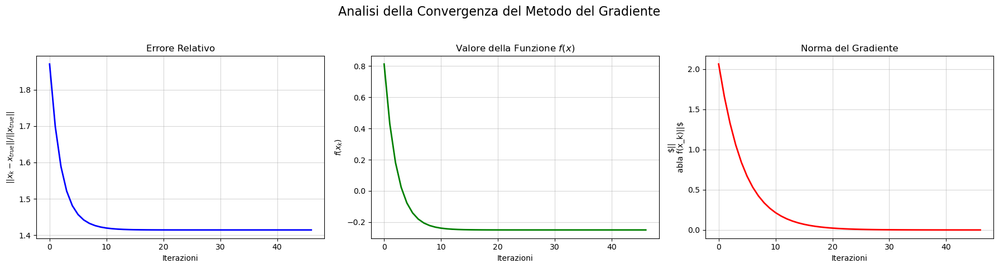

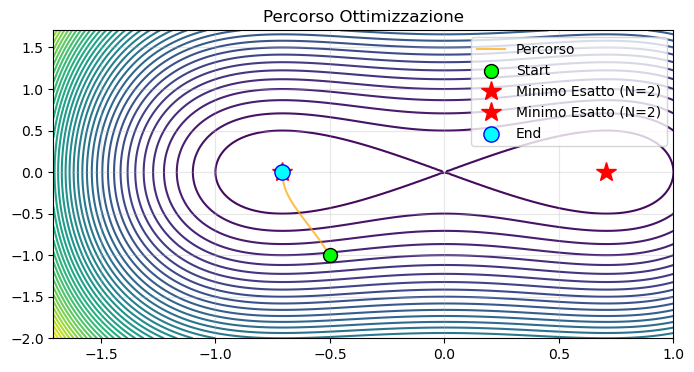

GD: Soluzione trovata: [-0.70710678  0.        ], Errore assoluto finale: 1.414e+00
con backtracking


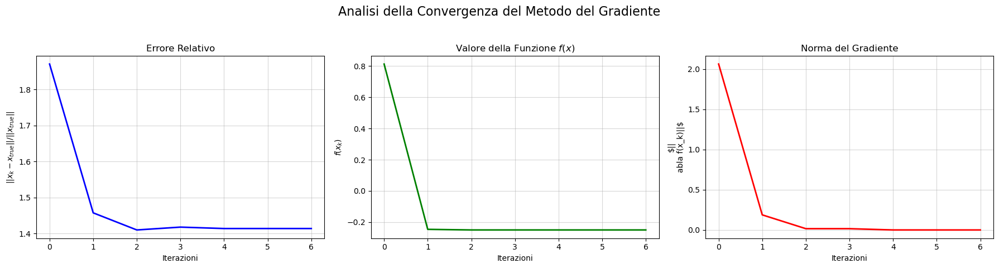

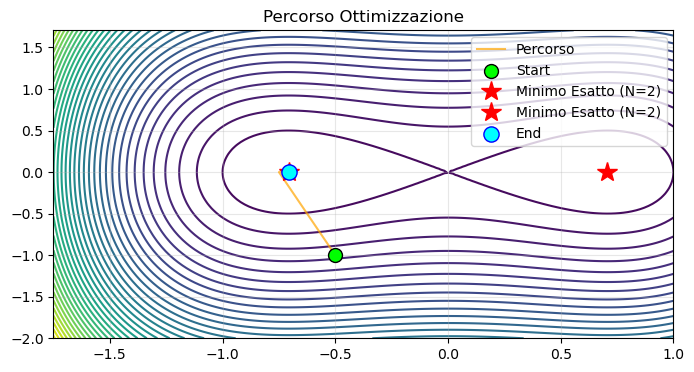

SGD: Soluzione trovata: [-0.70461029 -0.08041767], Errore assoluto finale: 1.416e+00
con passo fisso alpha=0.001 e batch size=1, quindi 1247.5 epoche


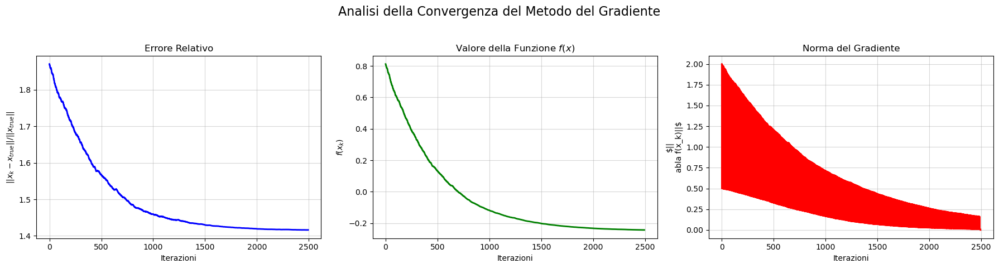

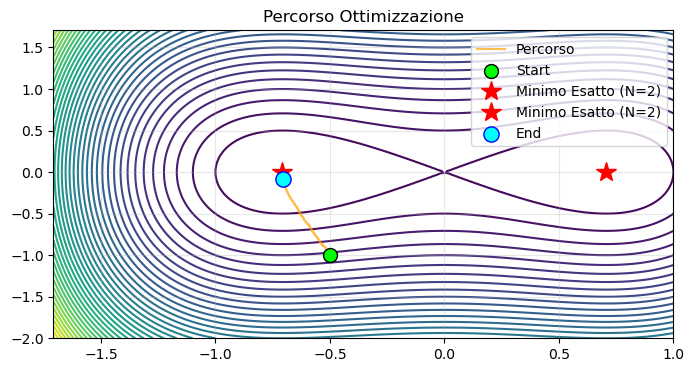

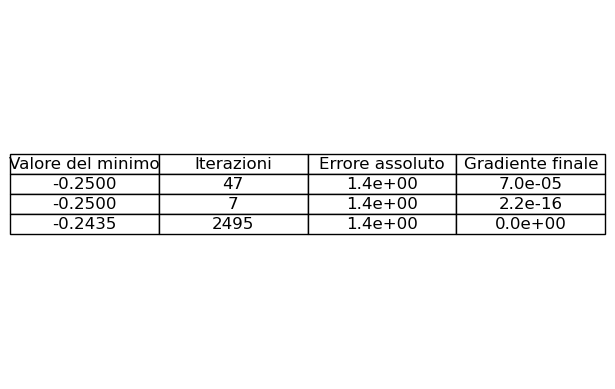

Punto iniziale [0.1 0.2]
GD: Soluzione trovata: [7.07106581e-01 3.32306999e-05], Errore assoluto finale: 1.414e+00
senza backtracking, passo fisso alpha=0.1


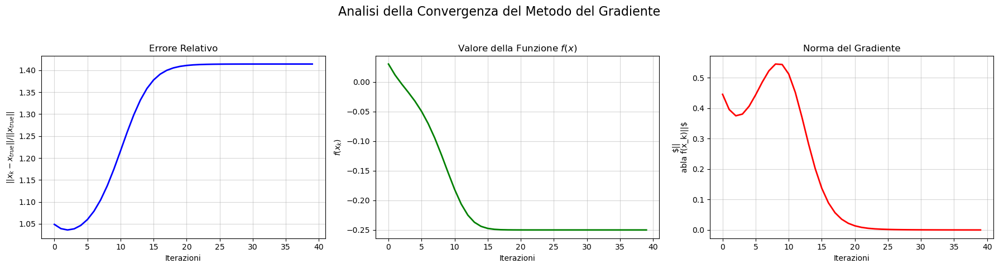

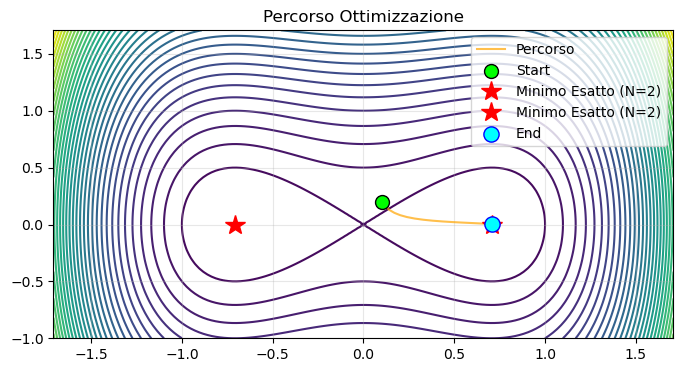

GD: Soluzione trovata: [0.70710678 0.        ], Errore assoluto finale: 1.414e+00
con backtracking


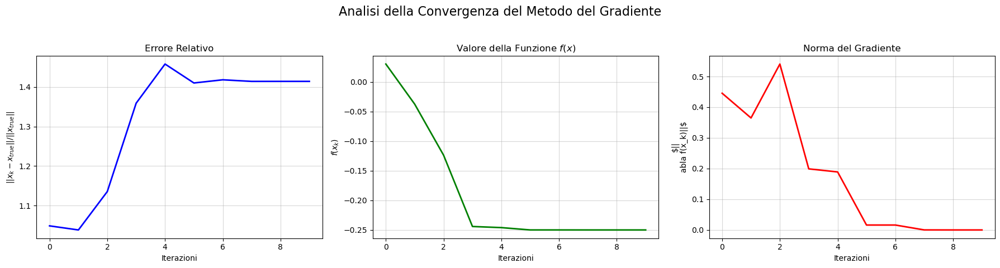

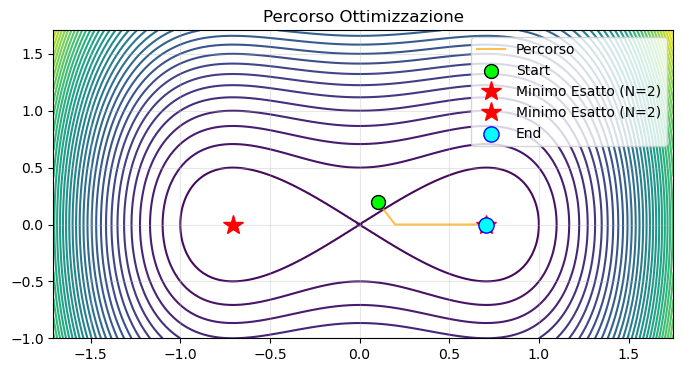

SGD: Soluzione trovata: [0.69803604 0.00498595], Errore assoluto finale: 1.405e+00
con passo fisso alpha=0.001 e batch size=1, quindi 1864.0 epoche


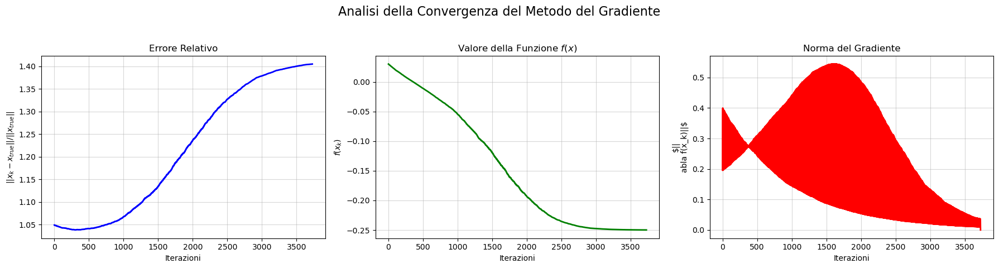

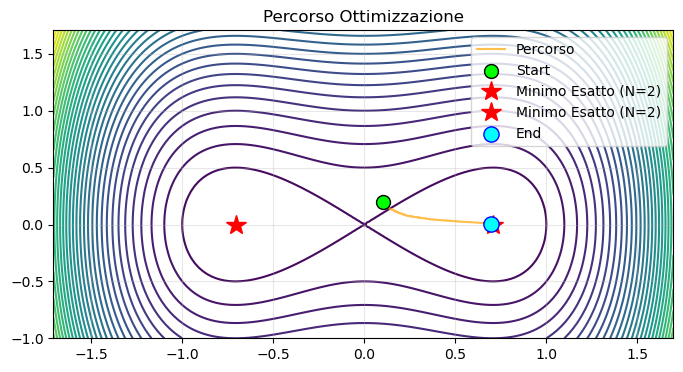

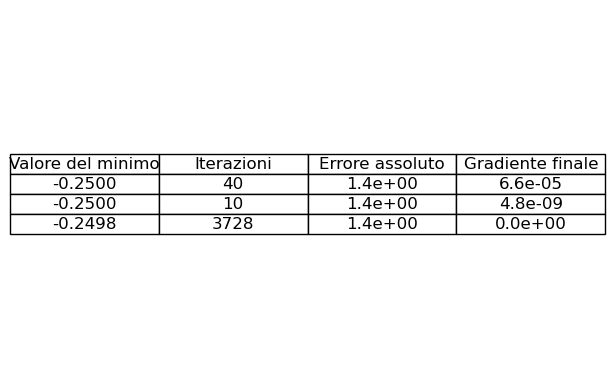

Matrice A:
[[0.17902998 0.11153904]
 [0.5723912  0.48561574]]
Vettore b: [0.29056901 1.05800694]
Parametro di regolarizzazione lambda: 0.35836132318518843
[Funzione minimi quadrati lineari] Plotting consentito: Dimensione input N=2
Plotting 'Funzione minimi quadrati lineari' usando modalità: Vettoriale (unico argomento)


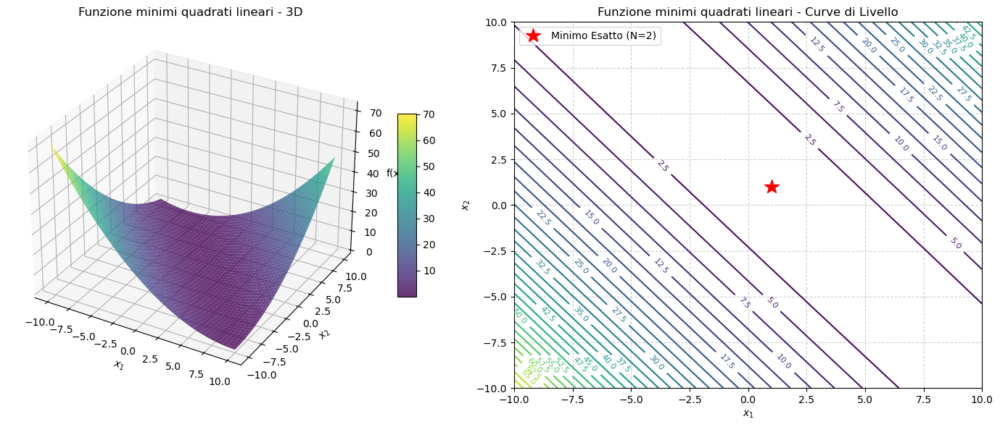

Punto iniziale [0. 0.]
GD: Soluzione trovata: [1.07269556 0.91245117], Errore assoluto finale: 8.047e-02
senza backtracking, passo fisso alpha=0.1


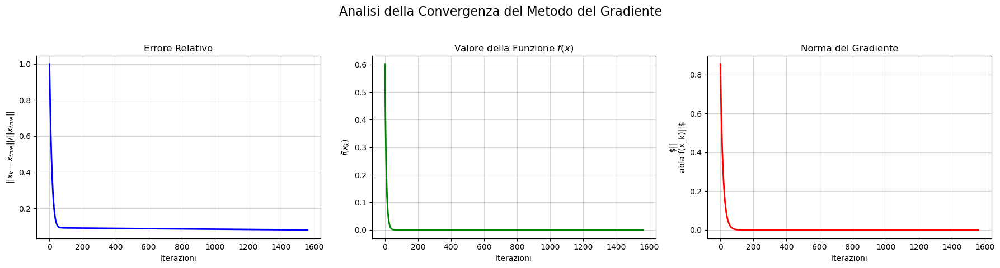

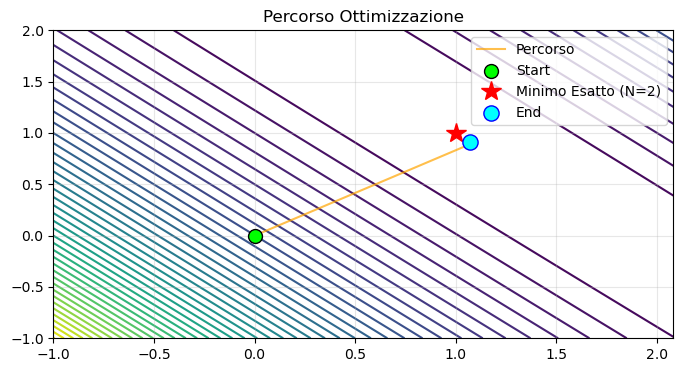

GD: Soluzione trovata: [1.01453058 0.98250051], Errore assoluto finale: 1.608e-02
con backtracking


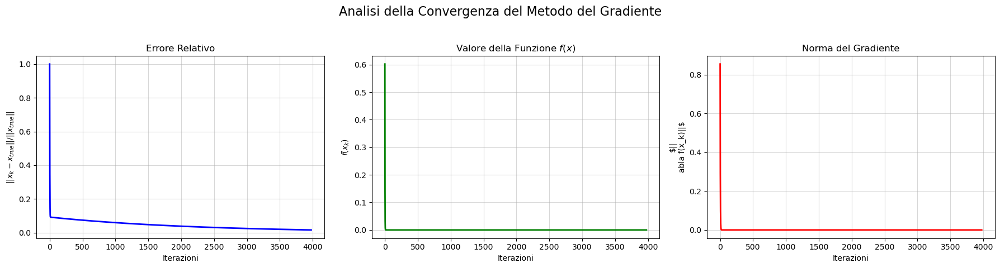

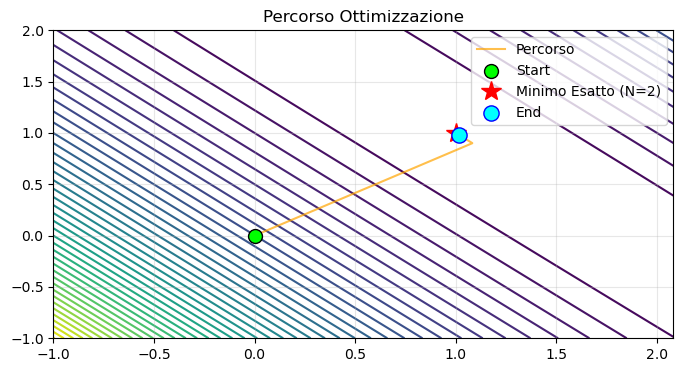

SGD: Soluzione trovata: [0.89501171 0.74407744], Errore assoluto finale: 1.956e-01
con passo fisso alpha=0.001 e batch size=1, quindi 2828.5 epoche


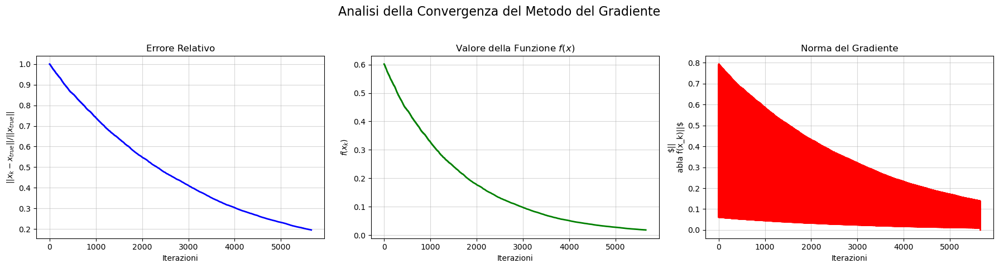

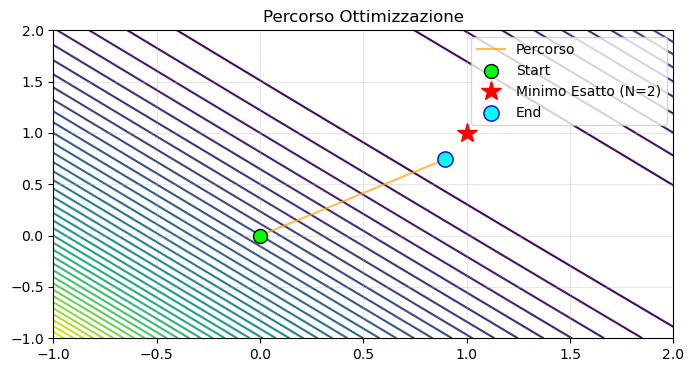

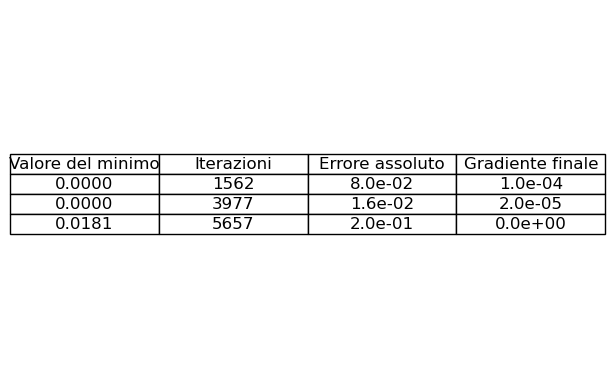

Matrice A:
[[0.88189341 0.27807209 0.42257788 0.92067324 0.35920679]
 [0.92167697 0.15784553 0.65914953 0.91085822 0.34121908]
 [0.29757372 0.43541352 0.23146489 0.33664649 0.36783457]
 [0.57944739 0.26379965 0.46261157 0.04534813 0.22669541]
 [0.63922697 0.02538083 0.15568416 0.25470032 0.94501398]]
Vettore b: [2.86242342 2.99074934 1.66893319 1.57790214 2.02000626]
Parametro di regolarizzazione lambda: 0.022950625782724332
Soluzione esatta: [1. 1. 1. 1. 1.]
Punto iniziale [0.99380827 0.97848707 0.9726293  0.67143035 0.40648979]
GD: Soluzione trovata: [1.04411986 1.0144568  0.95112695 0.98980554 0.98045019], Errore assoluto finale: 3.172e-02
senza backtracking, passo fisso alpha=0.01


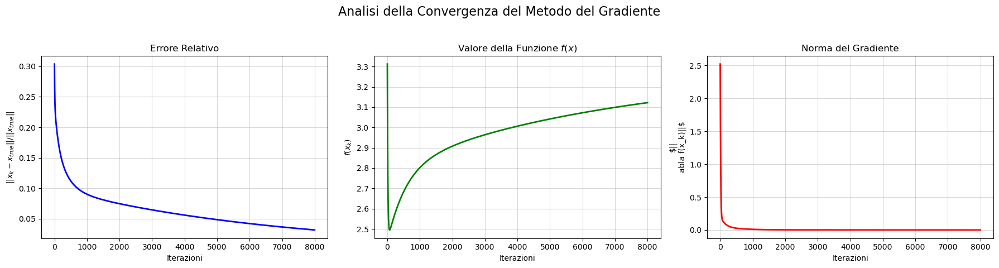

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=5 > 2 (impossibile visualizzare percorso in 2D)
GD: Soluzione trovata: [1.78511853 1.20145598 1.39137113 1.30571819 0.98533395], Errore assoluto finale: 4.252e-01
con backtracking


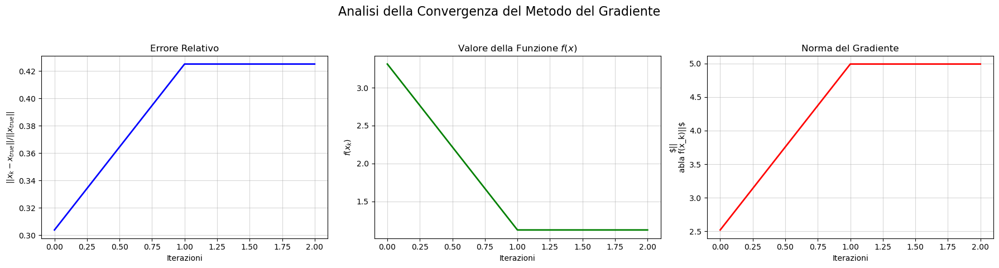

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=5 > 2 (impossibile visualizzare percorso in 2D)
SGD: Soluzione trovata: [1.22926172 1.04169137 1.08317874 0.85552169 0.61746424], Errore assoluto finale: 2.137e-01
con passo fisso alpha=0.001 e batch size=2, quindi 779.2 epoche


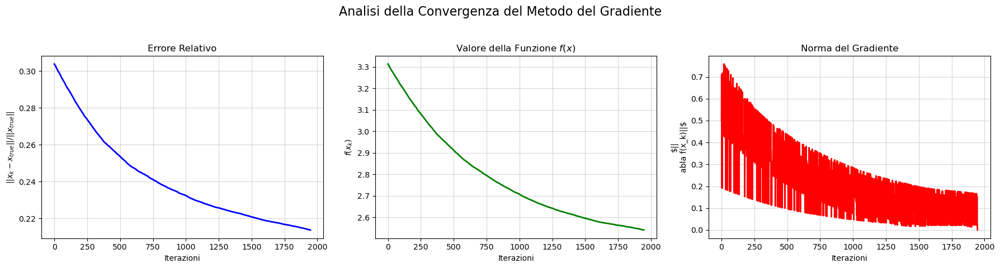

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=5 > 2 (impossibile visualizzare percorso in 2D)


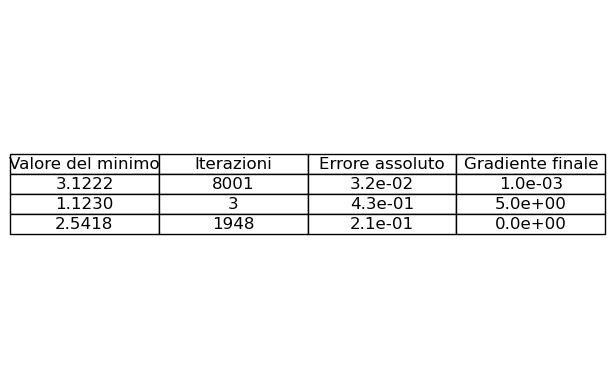

Matrice A:
[[0.24617737 0.75226559]
 [0.80791283 0.41849998]]
Vettore b: [0.99844296 1.22641281]
Parametro di regolarizzazione lambda: 0.23096958623349695
[Funzione minimi quadrati con regolarizzazione] Plotting consentito: Dimensione input N=2
Plotting 'Funzione minimi quadrati con regolarizzazione' usando modalità: Vettoriale (unico argomento)


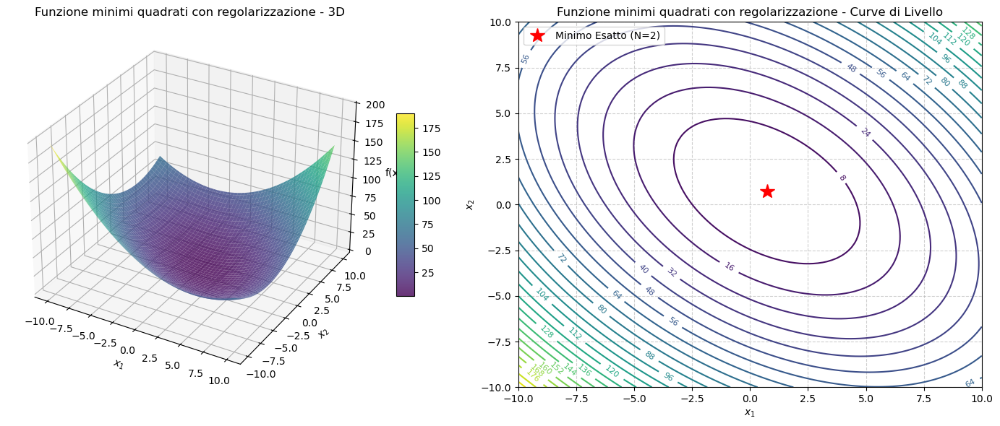

Punto iniziale [0. 0.]
GD: Soluzione trovata: [0.72448442 0.73587605], Errore assoluto finale: 1.117e-04
senza backtracking, passo fisso alpha=0.1


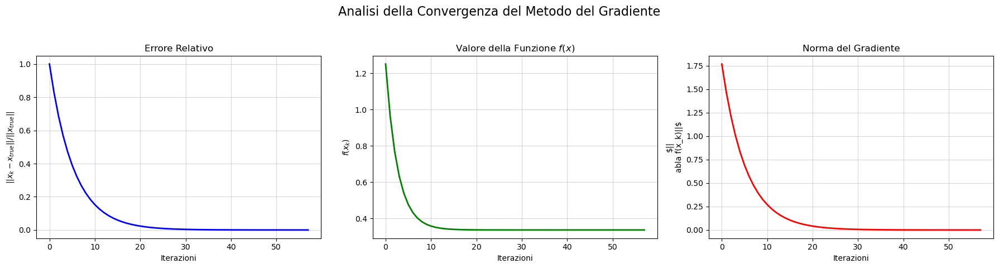

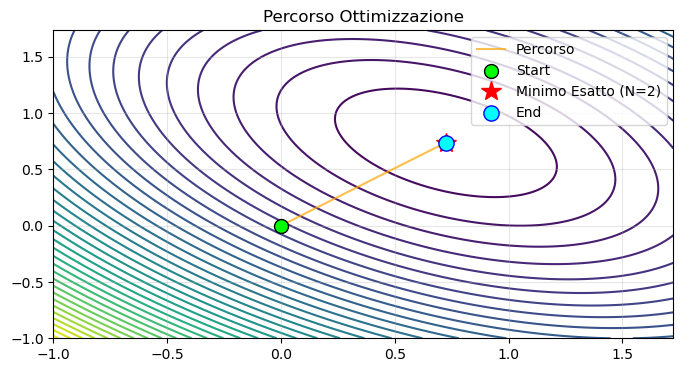

GD: Soluzione trovata: [0.72456725 0.73582763], Errore assoluto finale: 1.921e-05
con backtracking


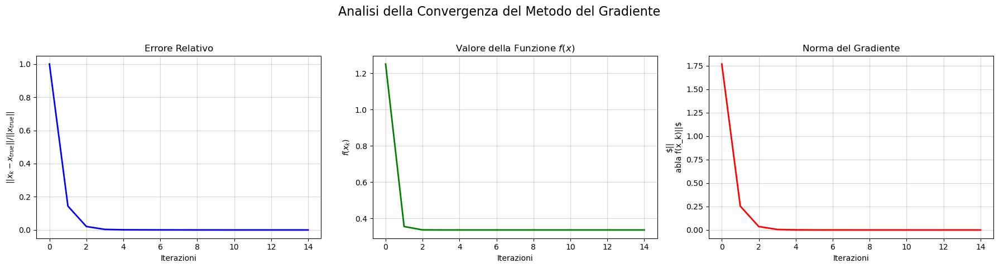

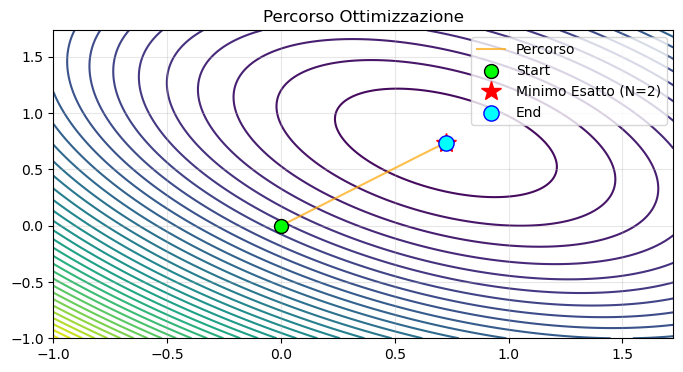

SGD: Soluzione trovata: [0.5724126  0.57987246], Errore assoluto finale: 2.111e-01
con passo fisso alpha=0.001 e batch size=1, quindi 10000.5 epoche


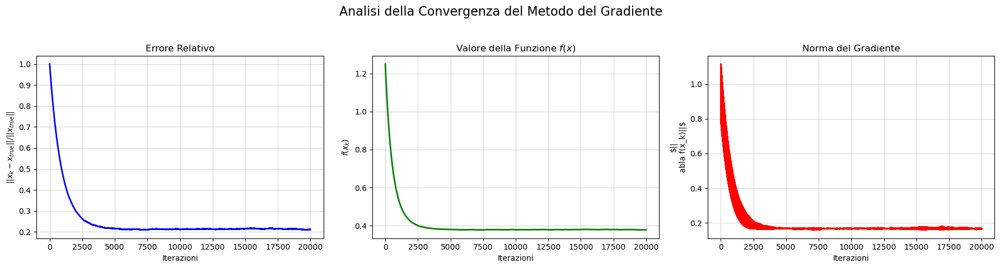

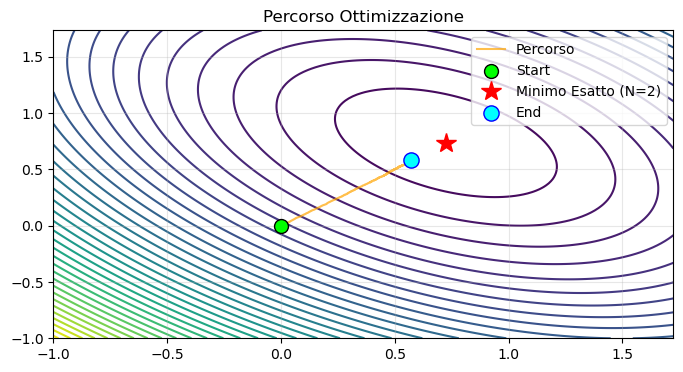

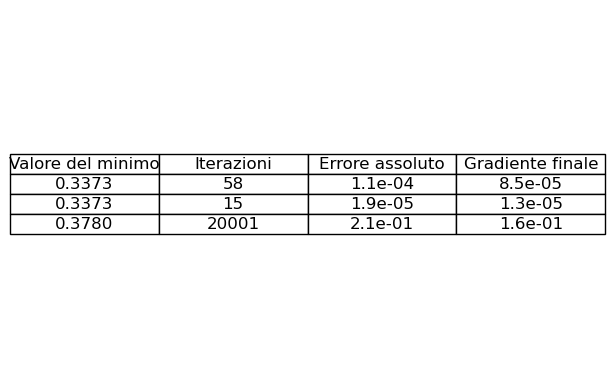

Matrice A:
[[0.83031508 0.23668168 0.98948212 0.51686744 0.38822032]
 [0.25026471 0.04634904 0.12824045 0.1945484  0.3273268 ]
 [0.64623405 0.19220519 0.10704167 0.64124336 0.72213143]
 [0.56843614 0.10654643 0.50449786 0.42064251 0.01983173]
 [0.86209921 0.10646383 0.46312786 0.65061113 0.53429884]]
Vettore b: [2.96156665 0.9467294  2.3088557  1.61995467 2.61660087]
Parametro di regolarizzazione lambda: 0.27206541264502215
Soluzione esatta: [1. 1. 1. 1. 1.]
Punto iniziale [0.08135246 0.9612983  0.0459122  0.71495184 0.2293217 ]
GD: Soluzione trovata: [0.90279222 1.08704274 1.01671455 1.10153514 0.98212827], Errore assoluto finale: 7.475e-02
senza backtracking, passo fisso alpha=0.01


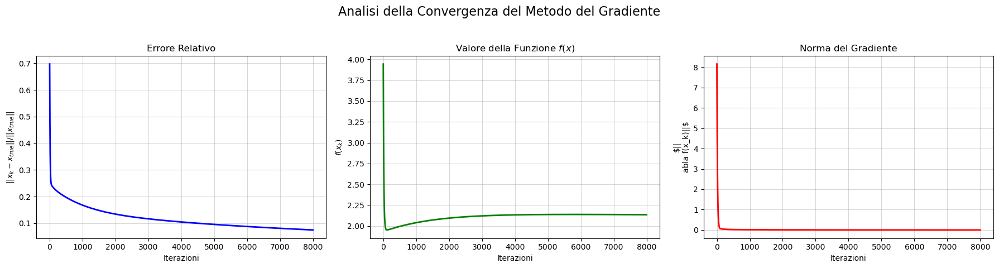

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=5 > 2 (impossibile visualizzare percorso in 2D)
GD: Soluzione trovata: [2.64392016 1.52975206 1.94867202 2.63805686 1.77984554], Errore assoluto finale: 1.198e+00
con backtracking


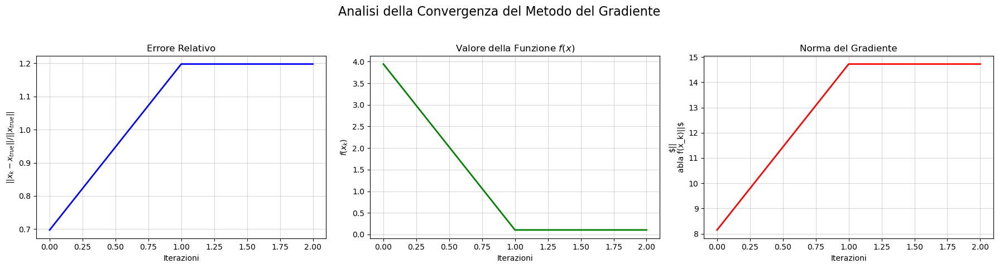

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=5 > 2 (impossibile visualizzare percorso in 2D)
SGD: Soluzione trovata: [0.940537   1.1536353  0.70793624 1.35159318 0.74267222], Errore assoluto finale: 2.459e-01
con passo fisso alpha=0.001 e batch size=2, quindi 1021.6 epoche


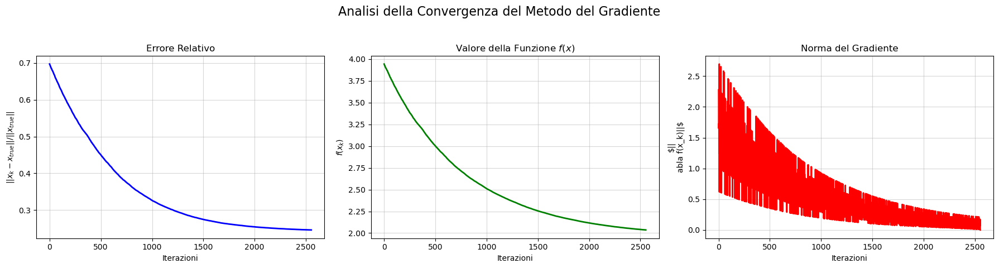

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=5 > 2 (impossibile visualizzare percorso in 2D)


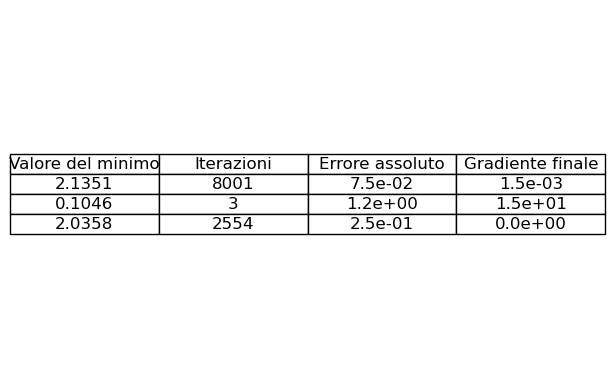

[Funzione F] Plotting consentito: Dimensione input N=2
Plotting 'Funzione F' usando modalità: Vettoriale (unico argomento)


C:\Users\alext\AppData\Local\Temp\ipykernel_13300\48093208.py:15: RuntimeWarning: invalid value encountered in log
  term_ln = np.sum(np.log(x), axis=0)


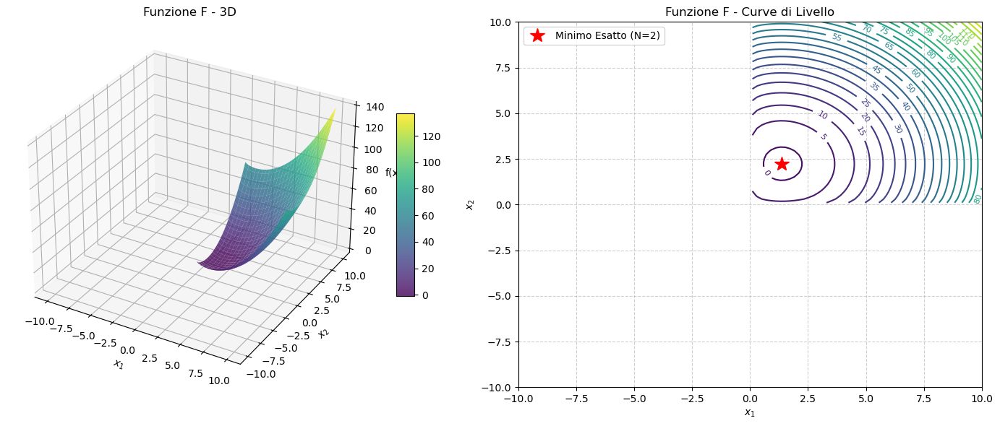

Punto iniziale [1. 1.]
GD: Soluzione trovata: [1.36602385 2.22471255], Errore assoluto finale: 1.239e-05
senza backtracking, passo fisso alpha=0.1


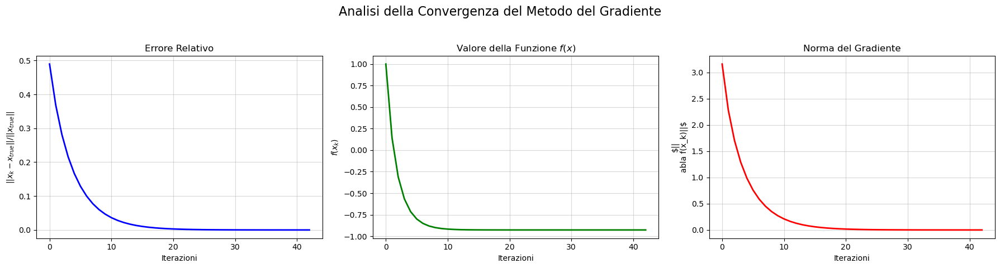

C:\Users\alext\AppData\Local\Temp\ipykernel_13300\48093208.py:15: RuntimeWarning: divide by zero encountered in log
  term_ln = np.sum(np.log(x), axis=0)


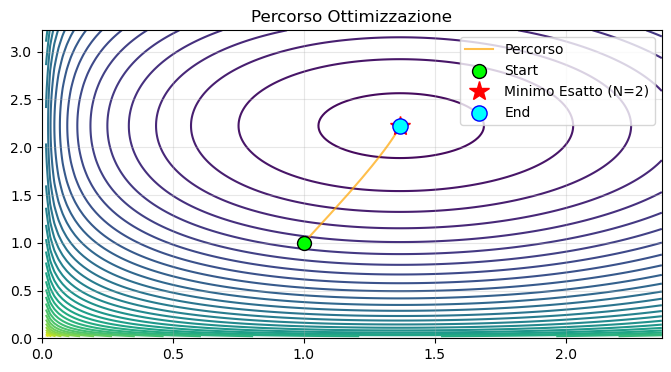

GD: Soluzione trovata: [1.36602452 2.22474487], Errore assoluto finale: 3.391e-07
con backtracking


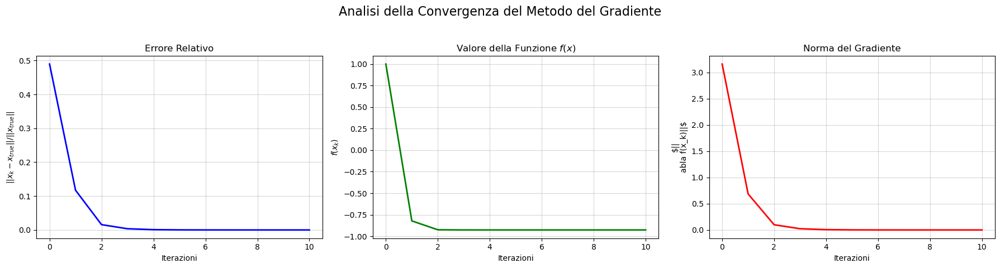

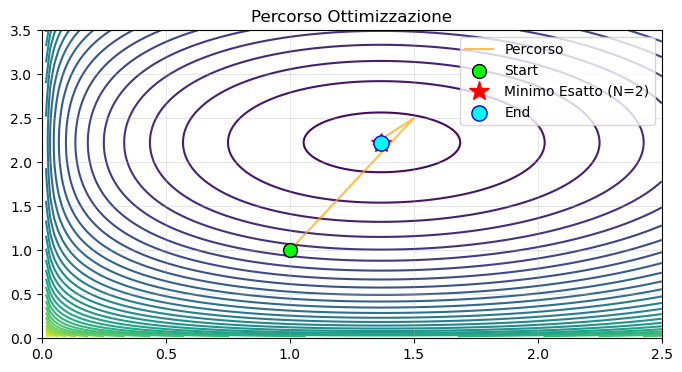

SGD: Soluzione trovata: [1.36544518 2.22027025], Errore assoluto finale: 1.728e-03
con passo fisso alpha=0.001 e batch size=1, quindi 1257.5 epoche


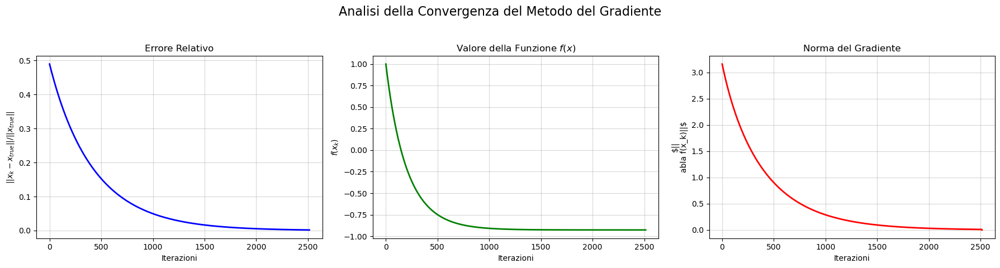

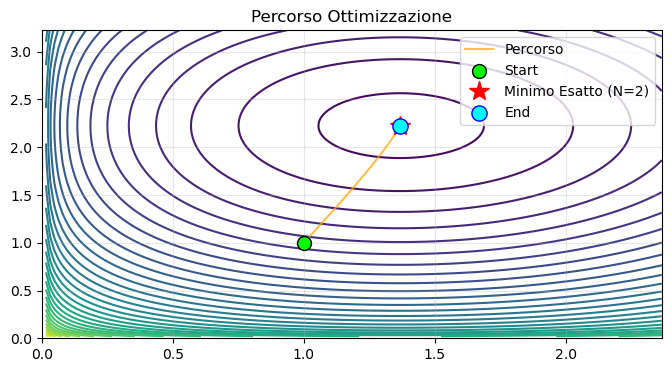

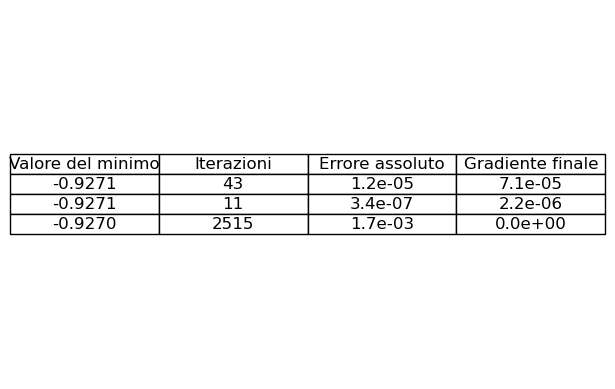

Punto iniziale [4.31578475 9.23393365 9.03341837 4.86161476 2.13841474 2.50000951
 5.09769569 2.5955595  1.49272944 4.34451134 2.32973805 5.79404253
 3.14081889 4.2814665  9.07379592 1.87389641 7.02006678 2.97340901
 4.60074166 9.29002535 9.9180679  7.44218144 9.4341186  2.30682385
 2.74169985 7.31456685 5.72160046 1.4093155  4.73395703 5.67748136
 5.87512525 6.32275284 4.37922296 7.87334532 8.44278968 2.58173405
 4.54060684 9.13038477 8.4346439  2.18900169 8.89420394 8.76844747
 6.75331105 6.89239348 7.7701359  3.74487424 7.125555   4.13352136
 2.9639281  8.37401808 1.57359934 3.90567016 2.34517053 2.44532899
 9.70250749 8.58181021 2.23268787 1.83845413 6.32174842 6.6029847
 9.23691945 1.57794249 3.480569   4.83593604 5.96467379 7.42707197
 9.25506468 1.23302675 1.64161284 3.68276529 3.16374853 4.68168365
 4.15579676 7.35125345 2.01502662 9.55400363 6.57484343 3.20495714
 2.78667595 5.37387316 8.89894397 3.86803621 3.27139165 9.51439281
 2.54835004 4.48851352 7.68377206 9.42503097 8.3

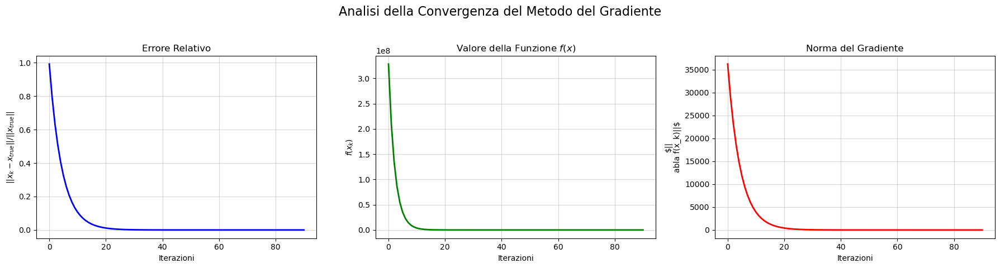

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=1000 > 2 (impossibile visualizzare percorso in 2D)
GD: Soluzione trovata: [   1.36602749    2.22474487    3.1583124     4.12132034    5.09807621
    6.082207      7.07071421    8.0620192     9.05521679   10.04975247
   11.04526825   12.04152299   13.03834842   14.03562364   15.03325959
   16.0311892    17.02936105   18.02773504   19.02627944   20.02496883
   21.02378259   22.02270384   23.02171862   24.02081528   25.01998403
   26.01921657   27.01850583   28.01784577   29.01723114   30.01665742
   31.01612065   32.01561738   33.01514456   34.01469953   35.01427989
   36.01388353   37.01350858   38.01315334   39.0128163    40.0124961
   41.0121915    42.01190139   43.01162476   44.0113607    45.01110837
   46.010867     47.01063589   48.01041441   49.01020196   50.009998
   51.00980204   52.00961361   53.00943228   54.00925767   55.00908941
   56.00892715   57.00877058   58.00861941   59.00847336   60.00833218
   61.008195

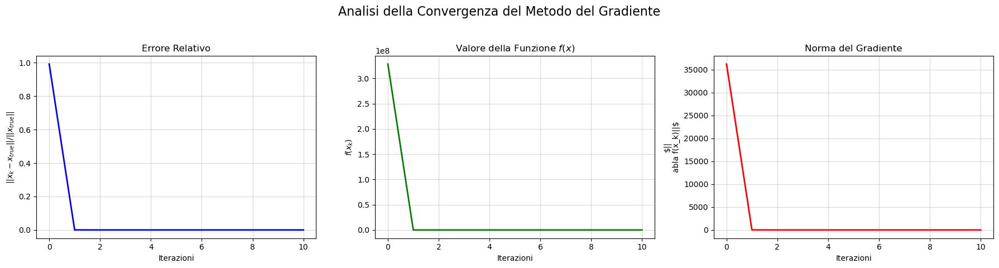

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=1000 > 2 (impossibile visualizzare percorso in 2D)
SGD: Soluzione trovata: [   1.36602542    2.22474535    3.15831319    4.12132047    5.09807561
    6.08220621    7.07071375    8.06201788    9.05521491   10.04975102
   11.04526602   12.04152136   13.03834582   14.03562107   15.033258
   16.03118544   17.02935838   18.02773101   19.02627557   20.02496594
   21.02377959   22.0226999    23.02171494   24.0208094    25.01997799
   26.01921149   27.01850005   28.01783854   29.01722453   30.01665079
   31.0161138    32.01561037   33.01513676   34.01469239   35.01427263
   36.01387441   37.01349971   38.01314545   39.01280794   40.01248576
   41.01218271   42.0118923    43.01161485   44.01135055   45.01109818
   46.01085543   47.01062497   48.01040239   49.01018935   50.0099866
   51.0097885    52.00960043   53.0094184    54.00924355   55.00907699
   56.00891415   57.00875557   58.00860401   59.00845892   60.00831753
   61.00818

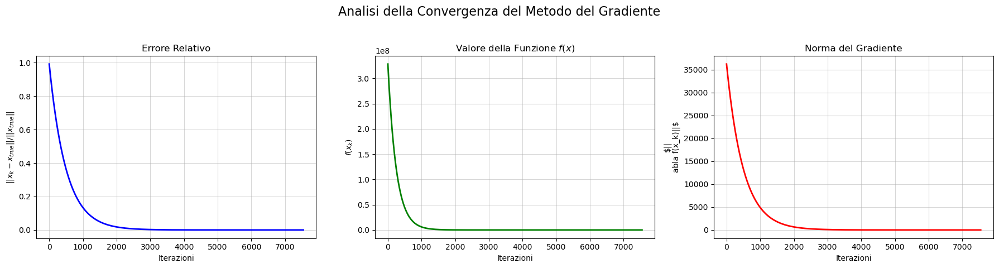

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=1000 > 2 (impossibile visualizzare percorso in 2D)


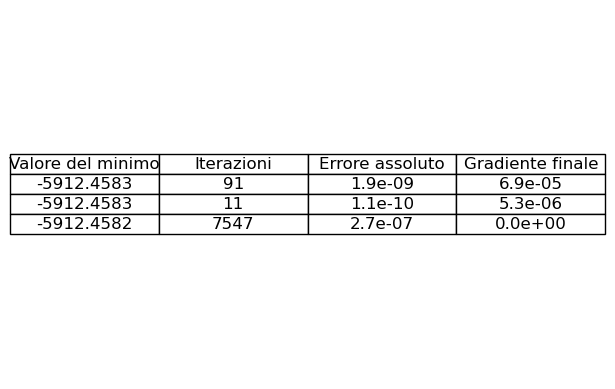

Punto iniziale [6.11847198 2.33150549 7.40178138 ... 5.17211391 6.60890132 9.61116422]
GD: Soluzione trovata: [1.36602540e+00 2.22474487e+00 3.15831240e+00 ... 9.99800005e+03
 9.99900005e+03 1.00000000e+04], Errore assoluto finale: 6.669e-11
senza backtracking, passo fisso alpha=0.1


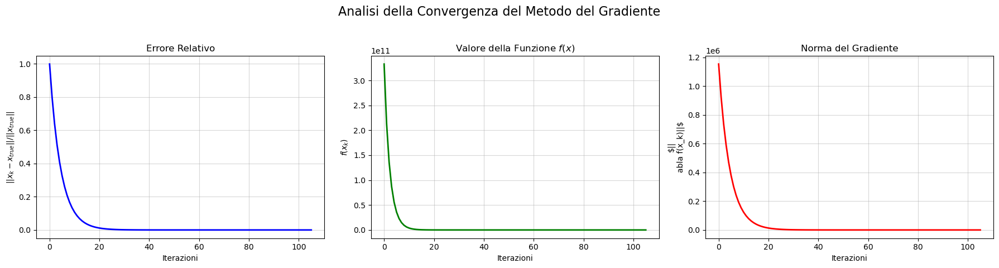

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=10000 > 2 (impossibile visualizzare percorso in 2D)
GD: Soluzione trovata: [1.36602475e+00 2.22474487e+00 3.15831240e+00 ... 9.99800005e+03
 9.99900005e+03 1.00000001e+04], Errore assoluto finale: 1.124e-12
con backtracking


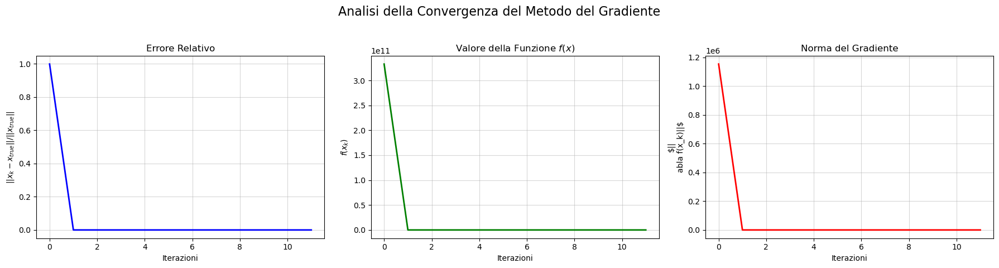

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=10000 > 2 (impossibile visualizzare percorso in 2D)
SGD: Soluzione trovata: [1.36602540e+00 2.22474487e+00 3.15831241e+00 ... 9.99799996e+03
 9.99899996e+03 9.99999996e+03], Errore assoluto finale: 8.635e-09
con passo fisso alpha=0.001 e batch size=10, quindi 9.275 epoche


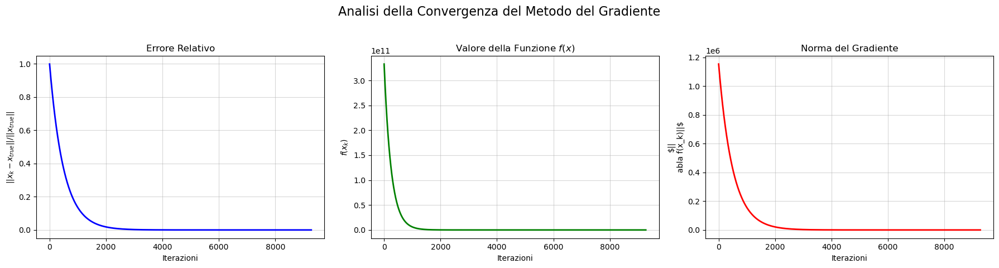

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=10000 > 2 (impossibile visualizzare percorso in 2D)


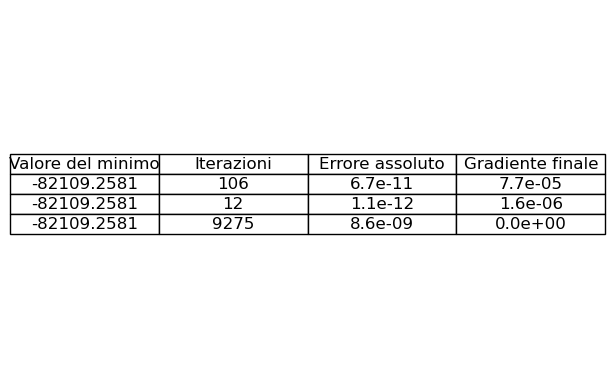

Configurazione:
 N=2
 c=-1.0
 b=[262.63415325 479.75255261]
[Funzione G] Plotting consentito: Dimensione input N=2
Plotting 'Funzione G' usando modalità: Vettoriale (unico argomento)


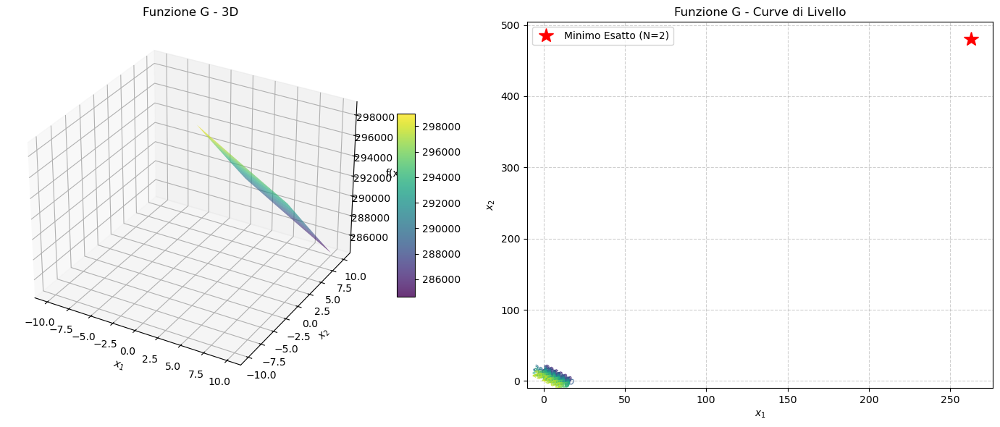

Punto iniziale [1. 1.]
GD: Soluzione trovata: [262.6360394  479.75356256], Errore assoluto finale: 6.721e-08
senza backtracking, passo fisso alpha=0.1


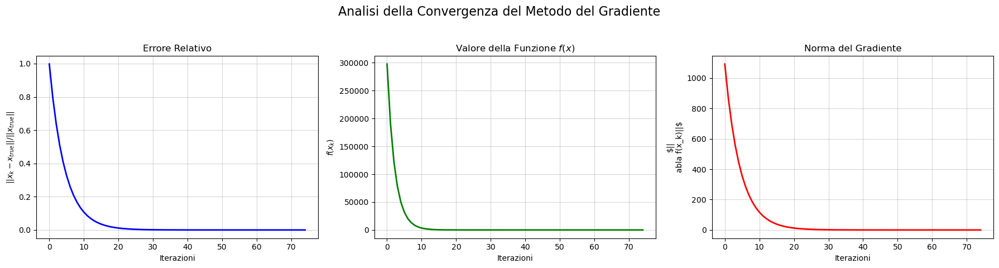

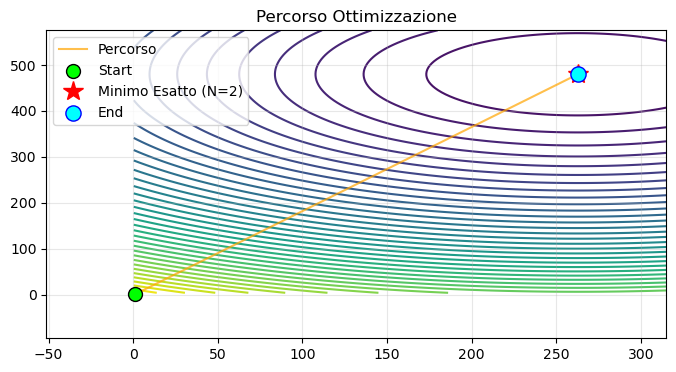

GD: Soluzione trovata: [262.63605702 479.75359482], Errore assoluto finale: 4.800e-14
con backtracking


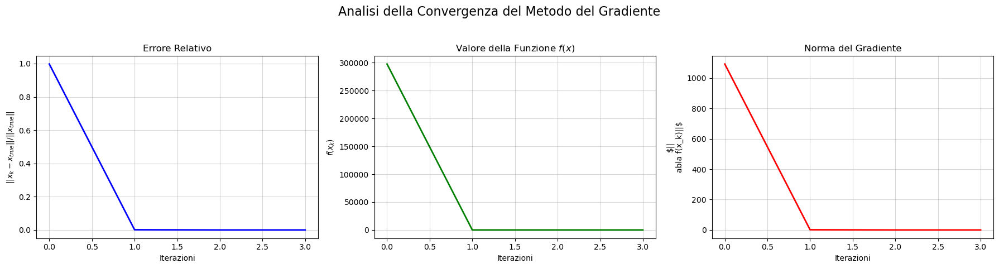

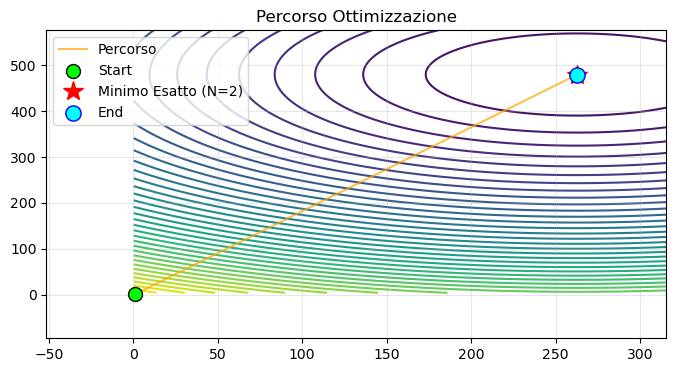

SGD: Soluzione trovata: [262.63296305 479.74915307], Errore assoluto finale: 9.897e-06
con passo fisso alpha=0.001 e batch size=1, quindi 2871.5 epoche


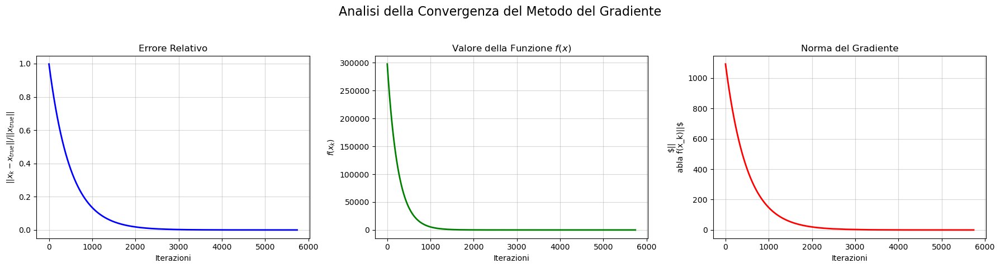

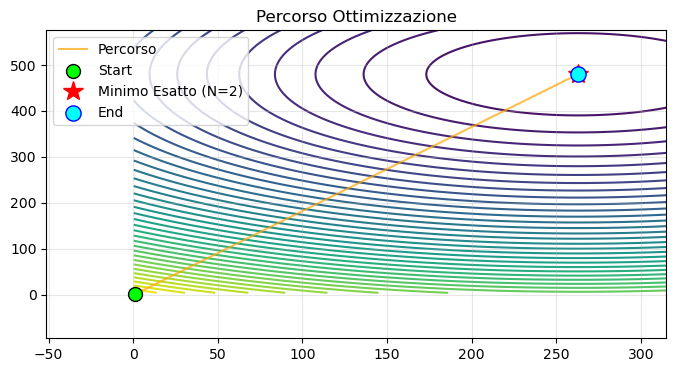

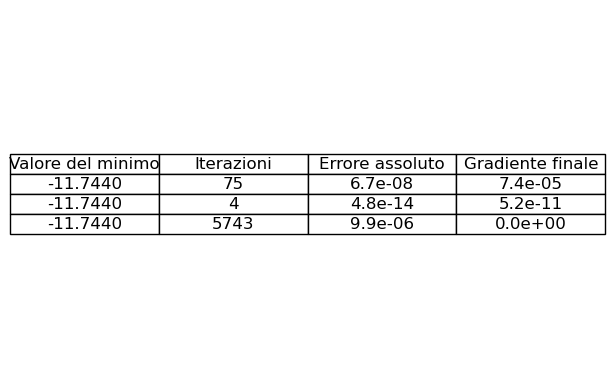

Configurazione:
 N=5
 c=-1.0
 b=[591.35756067 826.86149804  57.05469356 861.82318963 128.53911627]
Punto iniziale [0.69569556 0.19025374 0.96260641 0.72524174 0.16445103]
GD: Soluzione trovata: [591.35838988 826.86207994  57.06345419 861.82374603 128.5430025 ], Errore assoluto finale: 2.757e-08
senza backtracking, passo fisso alpha=0.1


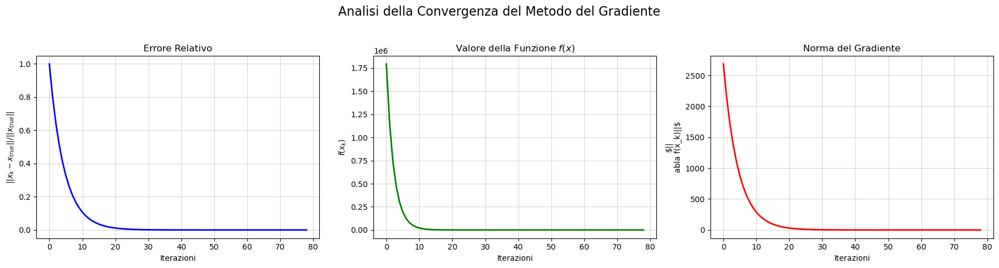

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=5 > 2 (impossibile visualizzare percorso in 2D)
GD: Soluzione trovata: [591.35840618 826.86210274  57.06345573 861.82376979 128.54300602], Errore assoluto finale: 1.363e-15
con backtracking


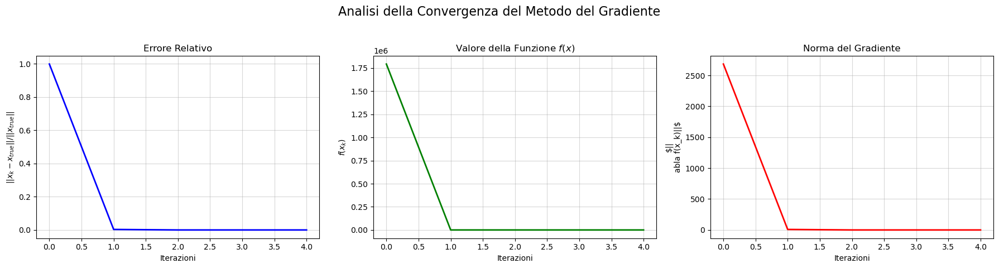

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=5 > 2 (impossibile visualizzare percorso in 2D)
SGD: Soluzione trovata: [591.35691851 826.85938827  57.05737558 861.82086578 128.54134881], Errore assoluto finale: 5.670e-06
con passo fisso alpha=0.001 e batch size=2, quindi 2395.6 epoche


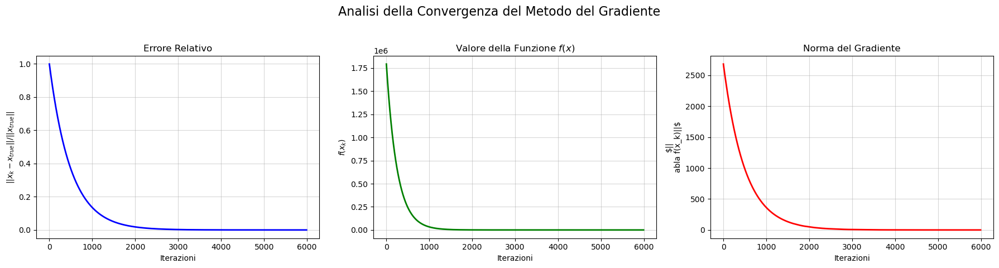

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=5 > 2 (impossibile visualizzare percorso in 2D)


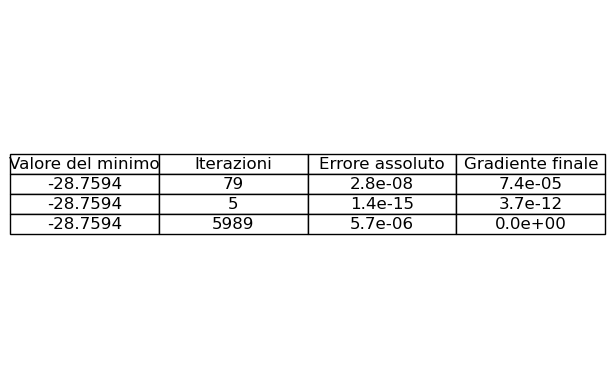

Configurazione:
 N=1000
 c=-1.0
 b=[ 361.02965603 1090.0783728   950.24629635  223.37573201  726.50944938
 1655.80518032  253.9610001  1504.3987294   314.326061   1053.10576142
 1025.74080362 1342.30587262  723.32234103 1814.16563443 1015.09769374
  542.08428373  802.05660372 1591.30187524  479.10517321 1251.76245449
 1174.62725001 1686.61928931 1251.61128064  816.5287969  1533.25608586
 1652.48173413 1976.37342797 1005.39391609 1351.99140762  353.72246156
 1328.69513061  986.09973873  356.83506771  615.78750208  977.8917664
  700.38824439 1021.82760146  110.92430205  959.80641588  550.51329438
 1333.11316945 1373.50322053  847.99794931   23.87842872 1159.18919363
 1345.06656311  420.09189218  214.931137   1939.28943327  356.95734637
 1978.27218246 1938.18195005  189.50705687  496.36826995 1201.03594206
  849.78115867 1404.39655953  566.09596396  858.32632351 1871.97209072
  731.87552655 1667.71930408 1096.5501895   530.55234776 1087.96460005
  230.58892025  266.2899276  1119.47211676 

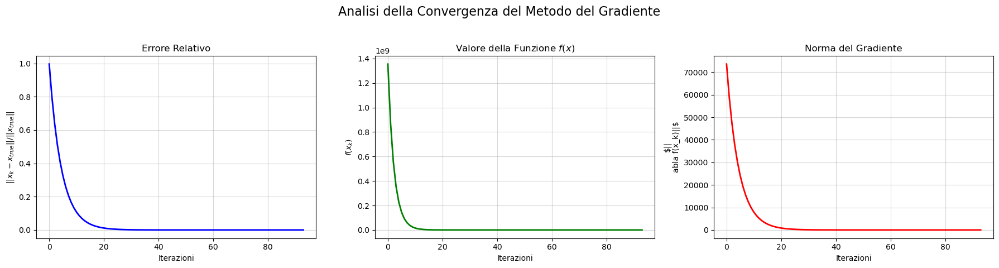

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=1000 > 2 (impossibile visualizzare percorso in 2D)
GD: Soluzione trovata: [ 361.03104095 1090.07883148  950.24682253  223.37797037  726.5101376
 1655.80548229  253.9629689  1504.39906176  314.3276517  1053.10623621
 1025.74129107 1342.30624511  723.32303228 1814.16591004 1015.0981863
  542.08520609  802.05722712 1591.30218945  479.10621682 1251.76285393
 1174.62767567 1686.61958576 1251.61168012  816.52940924 1533.25641196
 1652.4820367  1976.37368096 1005.39441341 1351.99177745  353.72387509
 1328.69550692  986.10024578  356.83646891  615.78831404  977.89227771
  700.38895828 1021.82809078  110.92880944  959.80693682  550.51420263
 1333.11354451 1373.50358456  847.99853894   23.89934979 1159.18962496
 1345.06693484  420.09308239  214.9334633  1939.2896911   356.95874709
 1978.27243521 1938.18220802  189.50969526  496.36927727 1201.03635837
  849.78174705 1404.39691556  566.09684721  858.32690604 1871.97235781
  731.87620

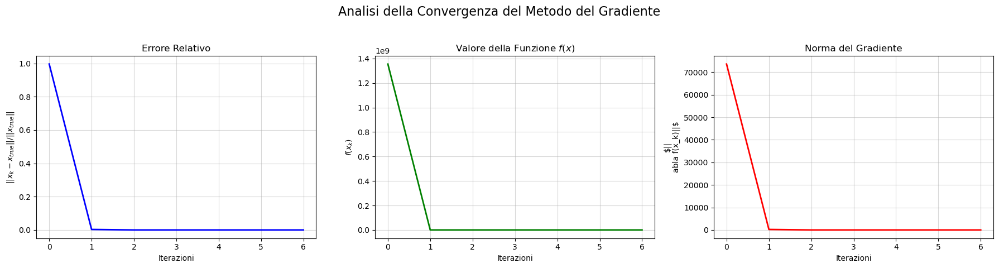

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=1000 > 2 (impossibile visualizzare percorso in 2D)
SGD: Soluzione trovata: [ 361.03095183 1090.07947797  950.24743883  223.37706382  726.51065009
 1655.80614006  253.96232384 1504.39972762  314.32737077 1053.10687807
 1025.74192572 1342.30691302  723.32354368 1814.16655073 1015.0988197
  542.08553368  802.05778478 1591.30285117  479.10643899 1251.76351901
 1174.62833368 1686.62023879 1251.61234379  816.52997405 1533.25707625
 1652.48269317 1976.37430207 1005.39504406 1351.99244617  353.72376028
 1328.69617351  986.10087164  356.83636477  615.78873258  977.89290176
  700.38945342 1021.82872627  110.92566402  959.80755501  550.51454081
 1333.1142122  1373.50425151  847.99911868   23.87981323 1159.19028065
 1345.0676019   420.09317486  214.93247203 1939.29031864  356.95864382
 1978.27305592 1938.18283581  189.5083976   496.36953079 1201.03701902
  849.78232792 1404.39758475  566.09720763  858.32748919 1871.97299194
  731.876

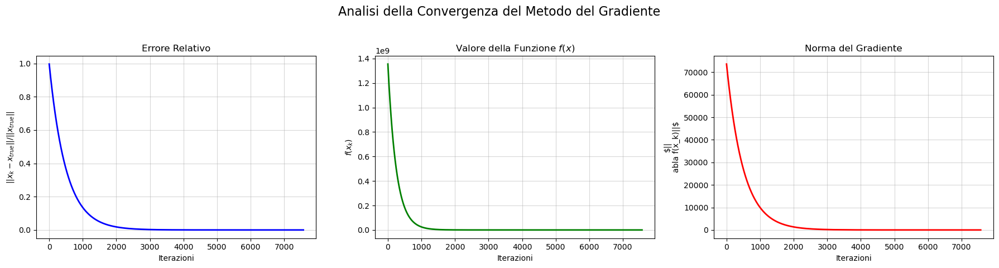

[Percorso Ottimizzazione] Skipping path plot: Dimensione input N=1000 > 2 (impossibile visualizzare percorso in 2D)


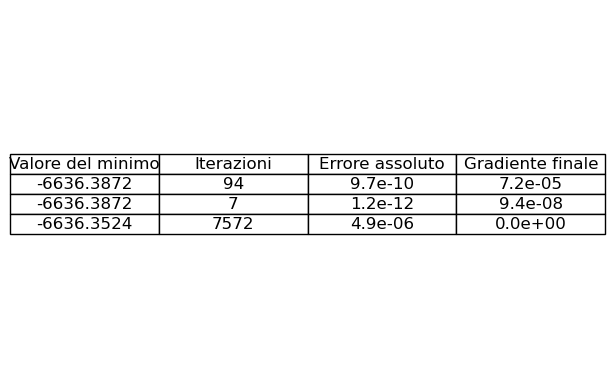

In [18]:

x0 = np.array([0.0, 0.0])
plot_3d_universal(f_a, get_exact_solution_a(), xn = x0, title_prefix="Funzione A")
test(f_a, grad_f_a, df_i_a, x0 = x0, x_true=get_exact_solution_a(), alpha=0.1)
show_GD(f_a, grad_f_a, x0, get_exact_solution_a(), alpha=0.01)
show_GD(f_a, grad_f_a, x0, get_exact_solution_a(), alpha=1)

x0 = np.array([0.0, 0.0])
plot_3d_universal(f_b, get_exact_solution_b(), xn = x0, title_prefix="Funzione di Rosenbrock")
test(f_b, grad_f_b, df_i_b, x0, get_exact_solution_b(), alpha=0.01)
show_GD(f_b, grad_f_b, x0, get_exact_solution_b(), alpha=0.005)
show_GD(f_b, grad_f_b, x0, get_exact_solution_b(), alpha=0.001)
x0 = np.array([-1.2, 0.0])
show_GD(f_b, grad_f_b, x0, get_exact_solution_b(), alpha=0.001)


x0 = np.array([0.5, 1.0])
plot_3d_universal(f_c, get_exact_solutions_c(), xn = x0, title_prefix="Funzione multimodale")
test(f_c, grad_f_c, df_i_c, x0, get_exact_solutions_c(), alpha=0.1)
x0 = np.array([-0.5, -1.0])
test(f_c, grad_f_c, df_i_c, x0, get_exact_solutions_c(), alpha=0.1)
x0 = np.array([0.1, 0.2])
test(f_c, grad_f_c, df_i_c, x0, get_exact_solutions_c(), alpha=0.1)

f_d, grad_f_d, df_i_d, get_exact_solution_d, A_d, b_d, lam_d = setup_problem_d(2)
x0 = np.array([0.0, 0.0])
plot_3d_universal(f_d, get_exact_solution_d(), x0, title_prefix="Funzione minimi quadrati lineari")
test(f_d, grad_f_d, df_i_d, x0 = x0, x_true=get_exact_solution_d(), alpha=0.1)
f_d_5, grad_f_d_5, df_i_d_5, get_exact_solution_d_5, A_d_5, b_d_5, lam_d_5 = setup_problem_d(5)
print(f"Soluzione esatta: {get_exact_solution_d_5()}")
x0 = np.zeros(5)
x0 = np.random.uniform(0, 1, 5)
test(f_d_5, grad_f_d_5, df_i_d_5, x0 = x0, x_true=get_exact_solution_d_5(), alpha=0.01, n = 5, batch_size=2)

f_e, grad_f_e, df_i_e, get_exact_solution_e, A_e, b_e, lam_e = setup_problem_e(2)
x0 = np.array([0.0, 0.0])
plot_3d_universal(f_e, get_exact_solution_e(), x0, title_prefix="Funzione minimi quadrati con regolarizzazione")
test(f_e, grad_f_e, df_i_e, x0 = x0, x_true=get_exact_solution_e(), alpha=0.1)
f_e_5, grad_f_e_5, df_i_e_5, get_exact_solution_e_5, A_e_5, b_e_5, lam_e_5 = setup_problem_d(5)
print(f"Soluzione esatta: {get_exact_solution_e_5()}")
x0 = np.zeros(5)
x0 = np.random.uniform(0, 1, 5)
test(f_e_5, grad_f_e_5, df_i_e_5, x0, get_exact_solution_e_5(), alpha=0.01, n = 5, batch_size=2)


x0 = np.array([1.0, 1.0])
plot_3d_universal(f_f, get_exact_solution_f(2), x0, title_prefix="Funzione F")
test(f_f, grad_f_f, df_i_f, x0 = x0, x_true=get_exact_solution_f(2), alpha=0.1)
x0 = np.random.uniform(1, 10, 1000)
test(f_f, grad_f_f, df_i_f, x0 = x0, x_true=get_exact_solution_f(1000), alpha=0.1, n = 1000, batch_size= 10)
x0 = np.random.uniform(1, 10, 10000)
test(f_f, grad_f_f, df_i_f, x0 = x0, x_true=get_exact_solution_f(10000), alpha=0.1, n = 10000, batch_size= 10)

f_g, grad_f_g, df_i_g, get_exact_solution_g, B_g = setup_problem_g(2)
x0 = np.array([1.0, 1.0])
plot_3d_universal(f_g, get_exact_solution_g(), x0, title_prefix="Funzione G")
test(f_g, grad_f_g, df_i_g, x0 = x0, x_true=get_exact_solution_g(), alpha=0.1)
f_g_5, grad_f_g_5, df_i_g_5, get_exact_solution_g_5, B_g_5 = setup_problem_g(5)
x0 = np.random.uniform(0, 1, 5)
test(f_g_5, grad_f_g_5, df_i_g_5, x0 = x0, x_true=get_exact_solution_g_5(), alpha=0.1, n=5, batch_size=2)
x0 = np.random.uniform(0, 10, 1000)
f_g_1, grad_f_g_1, df_i_g_1, get_exact_solution_g_1, B_g_1 = setup_problem_g(1000)
test(f_g_1, grad_f_g_1, df_i_g_1, x0 = x0, x_true=get_exact_solution_g_1(), alpha=0.1, n=1000, batch_size=10)

